# 📱 Smartphone Usage & Productivity
# Exploratory Data Analysis — Complete Project

---

| Field | Details |
|---|---|
| **Subject** | Exploratory data analysis|
| **Dataset** | sleep, stress, screen time and productivity |
| **Tools** | Python · Pandas · NumPy · Matplotlib · Seaborn · SciPy · Scikit-learn |

---

## 📚 Table of Contents
0. [Problem Statement & Dataset Justification](#0)
1. [Setup & Imports](#1)
2. [Data Loading & First Look](#2)
3. [Data Cleaning & Preprocessing](#3)
4. [Data Binning & Discretization](#4)
5. [Data Normalization & Scaling](#5)
6. [Custom Functions & Feature Engineering](#6)
7. [NumPy & Pandas Operations](#7)
8. [Univariate Analysis](#8)
9. [Bivariate Analysis](#9)
10. [Multivariate Analysis](#10)
11. [Specialized Visualizations](#11)
12. [Correlation Analysis](#12)
13. [Group-wise Analysis](#13)
14. [Outlier Detection](#14)
15. [Multiple Experiments / Models](#15)
16. [Statistical Testing (Simple)](#16)
17. [Key Insights & Executive Dashboard](#17)


---
## 0. Problem Statement & Dataset Justification <a id='0'></a>

### Problem Statement

> **"How does smartphone usage, sleep, stress, caffeine intake, and screentime
> behaviour collectively affect an individual's work productivity?
> Can we identify which lifestyle factors most strongly predict productivity levels?"**

---

### Objectives

1. Explore the distribution and structure of smartphone usage data across 50,000 users.
2. Identify correlations between lifestyle variables (sleep, stress, caffeine) and productivity.
4. Visualize findings using a variety of chart types for clear communication.
5. Model and predict productivity level using simple classification experiments.
6. Derive actionable insights from the analysis.

---

### Dataset Information

| Attribute | Details |
|---|---|
| **Name** | Smartphone Usage Productivity Dataset |
| **Source** | Kaggle (Synthetic Research Dataset) |
| **Records** | 50,000 rows |
| **Features** | 13 columns (mixed: numerical + categorical) |
| **Format** | CSV |

---

###  Feature/Attribute Understanding

| Column | Type | Description | Role |
|---|---|---|---|
| `User_ID` | Categorical | Unique user identifier | Identifier |
| `Age` | Numerical | User age (18–60) | Independent |
| `Gender` | Categorical | Male / Female / Other | Grouping |
| `Occupation` | Categorical | Student / Professional / Freelancer / Business Owner | Grouping |
| `Device_Type` | Categorical | Android / iOS | Grouping |
| `Daily_Phone_Hours` | Numerical | Hours spent on phone daily | Independent |
| `Social_Media_Hours` | Numerical | Hours on social media daily | Independent |
| `Work_Productivity_Score` | Numerical (1–10) | Self-reported productivity | **Target** |
| `Sleep_Hours` | Numerical | Hours of sleep per night | Independent |
| `Stress_Level` | Numerical (1–10) | Self-reported stress level | Independent |
| `App_Usage_Count` | Numerical | Number of apps used daily | Independent |
| `Caffeine_Intake_Cups` | Numerical | Coffee/tea cups per day | Independent |
| `Weekend_Screen_Time_Hours` | Numerical | Screen time on weekends | Independent |

---

### Justification for Dataset Selection

1. **Relevance** — Smartphone overuse is a widely researched public health concern; this dataset directly captures its relationship with productivity.
2. **Size** — 50,000 records ensures statistical reliability and generalisability of findings.
3. **Diversity** — Covers multiple occupations, genders, age groups, and device types — enabling rich group-wise comparisons.
4. **Completeness** — Zero missing values means no imputation bias in the analysis.
5. **Mixed Feature Types** — The combination of numerical and categorical features allows a wide variety of EDA and modelling techniques.
6. **Clear Target Variable** — `Work_Productivity_Score` serves as a well-defined output variable for both descriptive and predictive analysis.


---
## 1. Setup & Imports <a id='1'></a>

In [3]:
# ── Core ─────────────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd

# ── Visualisation ─────────────────────────────────────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import seaborn as sns
from matplotlib.ticker import MaxNLocator

# ── Statistics ────────────────────────────────────────────────────────────────
from scipy import stats
from scipy.stats import pearsonr, spearmanr

# ── Machine Learning (for experiments) ───────────────────────────────────────
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, mean_squared_error, r2_score)
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

# ── Global Style ──────────────────────────────────────────────────────────────
sns.set_theme(style='whitegrid', palette='muted', font_scale=1.1)
plt.rcParams.update({
    'figure.dpi'       : 120,
    'axes.titlesize'   : 14,
    'axes.titleweight' : 'bold',
    'axes.labelsize'   : 12,
    'figure.facecolor' : '#FAFAFA',
    'axes.facecolor'   : '#FAFAFA',
})
PALETTE = sns.color_palette('Set2')
print('All libraries loaded successfully!')
print('NumPy:', np.__version__, '| Pandas:', pd.__version__)

All libraries loaded successfully!
NumPy: 2.0.2 | Pandas: 2.2.2


---
## 2. Data Loading & First Look <a id='2'></a>

In [4]:
# ── Load Dataset ──────────────────────────────────────────────────────────────

df = pd.read_csv('Smartphone_Usage_Productivity_Dataset_50000.csv')
df_original = df.copy()   # keep a pristine backup

print(f' Dataset loaded!')
print(f'   Shape   : {df.shape[0]:,} rows × {df.shape[1]} columns')
print(f'   Columns : {list(df.columns)}')

 Dataset loaded!
   Shape   : 50,000 rows × 13 columns
   Columns : ['User_ID', 'Age', 'Gender', 'Occupation', 'Device_Type', 'Daily_Phone_Hours', 'Social_Media_Hours', 'Work_Productivity_Score', 'Sleep_Hours', 'Stress_Level', 'App_Usage_Count', 'Caffeine_Intake_Cups', 'Weekend_Screen_Time_Hours']


In [5]:
# First 5 rows
df.head()

,User_ID,Age,Gender,Occupation,Device_Type,Daily_Phone_Hours,Social_Media_Hours,Work_Productivity_Score,Sleep_Hours,Stress_Level,App_Usage_Count,Caffeine_Intake_Cups,Weekend_Screen_Time_Hours
0,U1,58,Male,Professional,Android,1.3,6.7,6,8.8,4,42,1,8.7
1,U2,25,Male,Professional,Android,1.2,1.5,5,6.4,1,51,3,5.1
2,U3,19,Male,Student,iOS,5.3,5.7,5,9.0,4,14,5,6.3
3,U4,35,Female,Business Owner,iOS,5.8,2.5,2,5.7,3,36,6,12.8
4,U5,33,Male,Freelancer,Android,7.9,1.3,4,5.7,3,37,5,9.9


In [6]:
#last 5 rows
df.tail()

,User_ID,Age,Gender,Occupation,Device_Type,Daily_Phone_Hours,Social_Media_Hours,Work_Productivity_Score,Sleep_Hours,Stress_Level,App_Usage_Count,Caffeine_Intake_Cups,Weekend_Screen_Time_Hours
49995,U49996,44,Male,Business Owner,Android,5.9,5.4,5,6.6,1,11,5,3.0
49996,U49997,42,Other,Business Owner,Android,2.9,7.4,9,6.3,2,20,4,6.2
49997,U49998,27,Female,Freelancer,iOS,1.4,2.5,4,6.7,9,39,4,5.1
49998,U49999,41,Female,Business Owner,iOS,8.9,3.0,6,5.5,2,51,0,9.2
49999,U50000,46,Other,Freelancer,Android,8.8,2.8,3,5.4,1,54,5,6.9


In [7]:
#checks for a fixed seed value
df.sample(5, random_state=42)

,User_ID,Age,Gender,Occupation,Device_Type,Daily_Phone_Hours,Social_Media_Hours,Work_Productivity_Score,Sleep_Hours,Stress_Level,App_Usage_Count,Caffeine_Intake_Cups,Weekend_Screen_Time_Hours
33553,U33554,42,Male,Business Owner,Android,7.4,7.4,2,8.5,8,18,1,3.8
9427,U9428,21,Other,Professional,iOS,1.4,2.4,3,4.3,2,6,6,7.6
199,U200,43,Male,Professional,iOS,8.4,1.0,8,8.6,4,26,4,7.9
12447,U12448,45,Other,Freelancer,iOS,3.4,2.9,4,6.7,9,24,3,7.5
39489,U39490,43,Female,Business Owner,iOS,4.7,6.6,3,8.6,2,35,4,4.4


In [8]:
info_df = pd.DataFrame({
    'Data Type'     : df.dtypes,
    'Non-Null Count': df.notnull().sum(),
    'Unique Values' : df.nunique(),
    'Memory (KB)'   : (df.memory_usage(deep=True)/1024).round(2)
})
print('📋 Column Metadata:')
info_df

📋 Column Metadata:


,Data Type,Non-Null Count,Unique Values,Memory (KB)
Age,int64,50000.0,43.0,390.62
App_Usage_Count,int64,50000.0,56.0,390.62
Caffeine_Intake_Cups,int64,50000.0,7.0,390.62
Daily_Phone_Hours,float64,50000.0,111.0,390.62
Device_Type,object,50000.0,2.0,2637.03
Gender,object,50000.0,3.0,2636.69
Index,NaN,NaN,NaN,0.13
Occupation,object,50000.0,4.0,2917.52
Sleep_Hours,float64,50000.0,51.0,390.62
Social_Media_Hours,float64,50000.0,76.0,390.62


In [9]:
#Statistical summary — numerical columns
df.describe().T.style.background_gradient(cmap='Blues').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
Age,50000.00,39.03,12.41,18.00,28.00,39.00,50.00,60.00
Daily_Phone_Hours,50000.00,6.51,3.17,1.00,3.80,6.50,9.20,12.00
Social_Media_Hours,50000.00,4.27,2.16,0.50,2.40,4.30,6.10,8.00
Work_Productivity_Score,50000.00,5.50,2.87,1.00,3.00,5.50,8.00,10.00
Sleep_Hours,50000.00,6.50,1.45,4.00,5.20,6.50,7.80,9.00
Stress_Level,50000.00,5.50,2.87,1.00,3.00,6.00,8.00,10.00
App_Usage_Count,50000.00,32.44,16.12,5.00,18.00,32.00,46.00,60.00
Caffeine_Intake_Cups,50000.00,3.00,2.00,0.00,1.00,3.00,5.00,6.00
Weekend_Screen_Time_Hours,50000.00,8.01,3.46,2.00,5.00,8.00,11.00,14.00


In [10]:
df.describe(include='object')

,User_ID,Gender,Occupation,Device_Type
count,50000,50000,50000,50000
unique,50000,3,4,2
top,U49984,Male,Professional,Android
freq,1,16708,12629,25080


---
## 3. Data Cleaning & Preprocessing <a id='3'></a>
> Check quality, fix issues, and prepare the data for analysis.

Missing Value Report
No missing values found in any column!


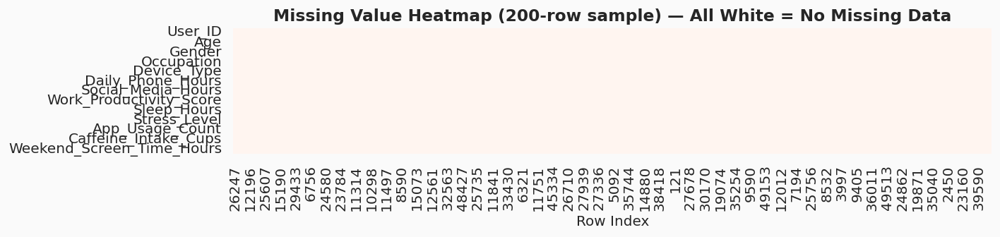

In [11]:
# ── 3.1 Missing Value Check ───────────────────────────────────────────────────
missing     = df.isnull().sum()
missing_pct = (missing / len(df) * 100).round(2)
miss_df     = pd.DataFrame({'Missing Count': missing, 'Missing %': missing_pct})

print('Missing Value Report')
print('=' * 40)
if missing.sum() == 0:
    print('No missing values found in any column!')
else:
    print(miss_df[miss_df['Missing Count'] > 0])

# Visual missing-value heatmap
fig, ax = plt.subplots(figsize=(12, 3))
sns.heatmap(df.isnull().sample(200, random_state=1).T,
            cbar=False, cmap='Reds', ax=ax, yticklabels=True)
ax.set_title('Missing Value Heatmap (200-row sample) — All White = No Missing Data',
             fontweight='bold')
ax.set_xlabel('Row Index')
plt.tight_layout()
plt.show()

In [12]:
# ── 3.2 Duplicate Check ──────────────────────────────────────────────────────
dups = df.duplicated().sum()
print(f'Duplicate rows : {dups}  ({dups/len(df)*100:.2f}%)')



Duplicate rows : 0  (0.00%)


In [13]:
# ── 3.3 Value Range Validation ───────────────────────────────────────────────
print('\n📏 Min / Max of each numerical column')
print('_'*55)
expected = {
    'Age': (18, 60), 'Daily_Phone_Hours': (0, 24),
    'Social_Media_Hours': (0, 24), 'Work_Productivity_Score': (1, 10),
    'Sleep_Hours': (0, 24), 'Stress_Level': (1, 10),
    'App_Usage_Count': (0, 200), 'Caffeine_Intake_Cups': (0, 20),
    'Weekend_Screen_Time_Hours': (0, 24)
}
for col, (lo, hi) in expected.items():
    mn, mx = df[col].min(), df[col].max()
    flag = '' if (mn >= lo and mx <= hi) else 'OUT OF RANGE'
    print(f'  {flag}  {col:<35s}  min={mn:.1f}  max={mx:.1f}  expected=[{lo},{hi}]')


📏 Min / Max of each numerical column
_______________________________________________________
    Age                                  min=18.0  max=60.0  expected=[18,60]
    Daily_Phone_Hours                    min=1.0  max=12.0  expected=[0,24]
    Social_Media_Hours                   min=0.5  max=8.0  expected=[0,24]
    Work_Productivity_Score              min=1.0  max=10.0  expected=[1,10]
    Sleep_Hours                          min=4.0  max=9.0  expected=[0,24]
    Stress_Level                         min=1.0  max=10.0  expected=[1,10]
    App_Usage_Count                      min=5.0  max=60.0  expected=[0,200]
    Caffeine_Intake_Cups                 min=0.0  max=6.0  expected=[0,20]
    Weekend_Screen_Time_Hours            min=2.0  max=14.0  expected=[0,24]


In [14]:
# ── 3.4 Categorical Value Checks ─────────────────────────────────────────────
for col in ['Gender', 'Occupation', 'Device_Type']:
    print(f'\n {col}:')
    print(df[col].value_counts().to_frame('Count'))


 Gender:
        Count
Gender       
Male    16708
Female  16679
Other   16613

 Occupation:
                Count
Occupation           
Professional    12629
Student         12517
Business Owner  12459
Freelancer      12395

 Device_Type:
             Count
Device_Type       
Android      25080
iOS          24920


In [15]:
# ── 3.5 Preprocessing Steps ──────────────────────────────────────────────────

# Step 1: Strip whitespace from string columns
str_cols = df.select_dtypes(include='object').columns
for col in str_cols:
    df[col] = df[col].str.strip()

# Step 2: Standardise column names (already snake_case, confirm)
df.columns = df.columns.str.strip()

# Step 3: Clip numerical values to valid ranges (guards against any edge cases)
df['Work_Productivity_Score'] = df['Work_Productivity_Score'].clip(1, 10)
df['Stress_Level']            = df['Stress_Level'].clip(1, 10)

# Step 4: Cast score columns explicitly to int
df['Work_Productivity_Score'] = df['Work_Productivity_Score'].astype(int)
df['Stress_Level']            = df['Stress_Level'].astype(int)

print(' Preprocessing complete!')
print(f'   Dataset shape unchanged: {df.shape}')
print(f'   No rows dropped — dataset is clean.')

 Preprocessing complete!
   Dataset shape unchanged: (50000, 13)
   No rows dropped — dataset is clean.


In [16]:
# ── 3.6 Label Encoding (for modelling later) ─────────────────────────────────
le = LabelEncoder()
df['Gender_enc']     = le.fit_transform(df['Gender'])
df['Occupation_enc'] = le.fit_transform(df['Occupation'])
df['Device_enc']     = le.fit_transform(df['Device_Type'])

print('Label-encoded columns added:')
print('  Gender_enc     :', dict(zip(df['Gender'].unique(), df['Gender_enc'].unique())))
print('  Occupation_enc :', dict(zip(df['Occupation'].unique(), df['Occupation_enc'].unique())))
print('  Device_enc     :', dict(zip(df['Device_Type'].unique(), df['Device_enc'].unique())))

Label-encoded columns added:
  Gender_enc     : {'Male': np.int64(1), 'Female': np.int64(0), 'Other': np.int64(2)}
  Occupation_enc : {'Professional': np.int64(2), 'Student': np.int64(3), 'Business Owner': np.int64(0), 'Freelancer': np.int64(1)}
  Device_enc     : {'Android': np.int64(0), 'iOS': np.int64(1)}


---
## 4. Data Binning & Discretization <a id='4'></a>
> Converting continuous numbers into meaningful categories using `pd.cut()`, `pd.qcut()`, and `np.digitize()`.

In [17]:
# ── pd.cut: Equal-Width Bins ─────────────────────────────────────────────────
df['Age_Group'] = pd.cut(df['Age'], bins=[17,25,35,45,60],
                          labels=['18-25','26-35','36-45','46-60'], right=True)

df['Phone_Usage_Bin'] = pd.cut(df['Daily_Phone_Hours'], bins=4,
                                labels=['Low','Moderate','High','Very High'])

# ── pd.qcut: Equal-Frequency Bins ────────────────────────────────────────────
df['Sleep_Quartile'] = pd.qcut(df['Sleep_Hours'], q=4,
                                labels=['Q1-Low Sleep','Q2 - Low-medium Sleep','Medium Sleep - Q3','Q4-High Sleep'])

# ── Manual Bins ───────────────────────────────────────────────────────────────
df['Stress_Category']    = pd.cut(df['Stress_Level'],
                                   bins=[0,3,6,10],
                                   labels=['Low (1-3)','Medium (4-6)','High (7-10)'])
df['Productivity_Level'] = pd.cut(df['Work_Productivity_Score'],
                                   bins=[0,3,6,10],
                                   labels=['Low (1-3)','Medium (4-6)','High (7-10)'])

# ── np.digitize: Manual Array-Based Binning ───────────────────────────────────
caffeine_edges       = np.array([0, 2, 4, 6, 10])
df['Caffeine_Bin']   = np.digitize(df['Caffeine_Intake_Cups'], bins=caffeine_edges)
df['Caffeine_Group'] = df['Caffeine_Bin'].map({1:'0-2 cups',2:'2-4 cups',
                                                3:'4-6 cups',4:'6+ cups'})
# Derived feature
df['Total_Screen_Time'] = df['Daily_Phone_Hours'] + df['Social_Media_Hours']

print(' Binning complete. New columns:')
print(['Age_Group','Phone_Usage_Bin','Sleep_Quartile','Stress_Category',
       'Productivity_Level','Caffeine_Group','Total_Screen_Time'])

 Binning complete. New columns:
['Age_Group', 'Phone_Usage_Bin', 'Sleep_Quartile', 'Stress_Category', 'Productivity_Level', 'Caffeine_Group', 'Total_Screen_Time']


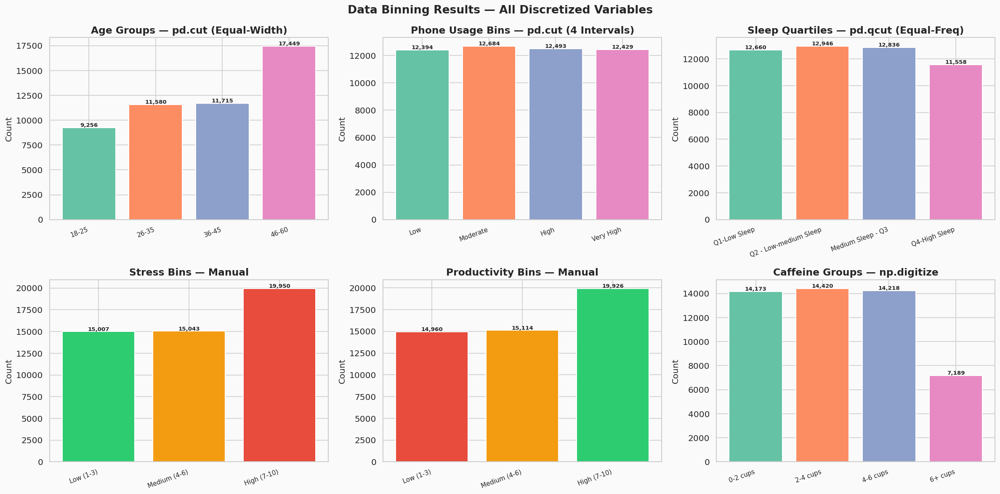

In [18]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
fig.suptitle('Data Binning Results — All Discretized Variables', fontsize=16, fontweight='bold')

bin_cfg = [
    ('Age_Group',        'Age Groups — pd.cut (Equal-Width)',          PALETTE[:4]),
    ('Phone_Usage_Bin',  'Phone Usage Bins — pd.cut (4 Intervals)',    PALETTE[:4]),
    ('Sleep_Quartile',   'Sleep Quartiles — pd.qcut (Equal-Freq)',     PALETTE[:4]),
    ('Stress_Category',  'Stress Bins — Manual',                      ['#2ecc71','#f39c12','#e74c3c']),
    ('Productivity_Level','Productivity Bins — Manual',               ['#e74c3c','#f39c12','#2ecc71']),
    ('Caffeine_Group',   'Caffeine Groups — np.digitize',             PALETTE[:4]),
]

for ax, (col, title, colors) in zip(axes.flatten(), bin_cfg):
    counts = df[col].value_counts().sort_index()
    bars   = ax.bar(range(len(counts)), counts.values,
                    color=colors[:len(counts)], edgecolor='white', linewidth=1.2)
    ax.set_xticks(range(len(counts)))
    ax.set_xticklabels(counts.index, rotation=20, ha='right', fontsize=9)
    ax.set_title(title); ax.set_ylabel('Count')
    for bar in bars:
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+80,
                f'{int(bar.get_height()):,}', ha='center', fontsize=8, fontweight='bold')

plt.tight_layout()
plt.show()

---
## 5. Data Normalization & Scaling <a id='5'></a>
> Three methods: **Min-Max** (0–1 range), **Z-Score** (mean=0, std=1), **Decimal Scaling**.

In [19]:
num_cols = ['Age','Daily_Phone_Hours','Social_Media_Hours','Work_Productivity_Score',
            'Sleep_Hours','Stress_Level','App_Usage_Count','Caffeine_Intake_Cups',
            'Weekend_Screen_Time_Hours']
df_num = df[num_cols].copy()

# 1. Min-Max Normalization  →  (x - min) / (max - min)
df_minmax = (df_num - df_num.min()) / (df_num.max() - df_num.min())
df_minmax.columns = [c+'_minmax' for c in df_minmax.columns]

# 2. Z-Score Standardization  →  (x - mean) / std
df_zscore = (df_num - df_num.mean()) / df_num.std()
df_zscore.columns = [c+'_zscore' for c in df_zscore.columns]

# 3. Decimal Scaling  →  x / 10^j  where j = digits in max value
df_decimal = df_num.copy()
for col in df_decimal.columns:
    j = len(str(int(df_decimal[col].abs().max())))
    df_decimal[col] = df_decimal[col] / (10**j)
df_decimal.columns = [c+'_decimal' for c in df_decimal.columns]

print('Normalization complete!')
print('\nMin-Max range check (all values should be 0 to 1):')
print(df_minmax.agg(['min','max']).round(3))

Normalization complete!

Min-Max range check (all values should be 0 to 1):
     Age_minmax  Daily_Phone_Hours_minmax  Social_Media_Hours_minmax  \
min         0.0                       0.0                        0.0   
max         1.0                       1.0                        1.0   

     Work_Productivity_Score_minmax  Sleep_Hours_minmax  Stress_Level_minmax  \
min                             0.0                 0.0                  0.0   
max                             1.0                 1.0                  1.0   

     App_Usage_Count_minmax  Caffeine_Intake_Cups_minmax  \
min                     0.0                          0.0   
max                     1.0                          1.0   

     Weekend_Screen_Time_Hours_minmax  
min                               0.0  
max                               1.0  


In [20]:
col = 'Daily_Phone_Hours'
comparison_df = pd.DataFrame({
    'Original'           : df_num[col],
    'Min-Max (0-1)'      : df_minmax[col+'_minmax'],
    'Z-Score'            : df_zscore[col+'_zscore'],
    'Decimal Scaled'     : df_decimal[col+'_decimal']
})
print(f'Comparison for: {col} — first 5 rows')
print(comparison_df.head().round(4))
print('\nSummary after Scaling:')
comparison_df.describe().round(3)

Comparison for: Daily_Phone_Hours — first 5 rows
   Original  Min-Max (0-1)  Z-Score  Decimal Scaled
0       1.3         0.0273  -1.6428           0.013
1       1.2         0.0182  -1.6743           0.012
2       5.3         0.3909  -0.3813           0.053
3       5.8         0.4364  -0.2236           0.058
4       7.9         0.6273   0.4386           0.079

Summary after Scaling:


,Original,Min-Max (0-1),Z-Score,Decimal Scaled
count,50000.000,50000.000,50000.000,50000.000
mean,6.509,0.501,0.000,0.065
std,3.171,0.288,1.000,0.032
min,1.000,0.000,-1.737,0.010
25%,3.800,0.255,-0.854,0.038
50%,6.500,0.500,-0.003,0.065
75%,9.200,0.745,0.849,0.092
max,12.000,1.000,1.732,0.120


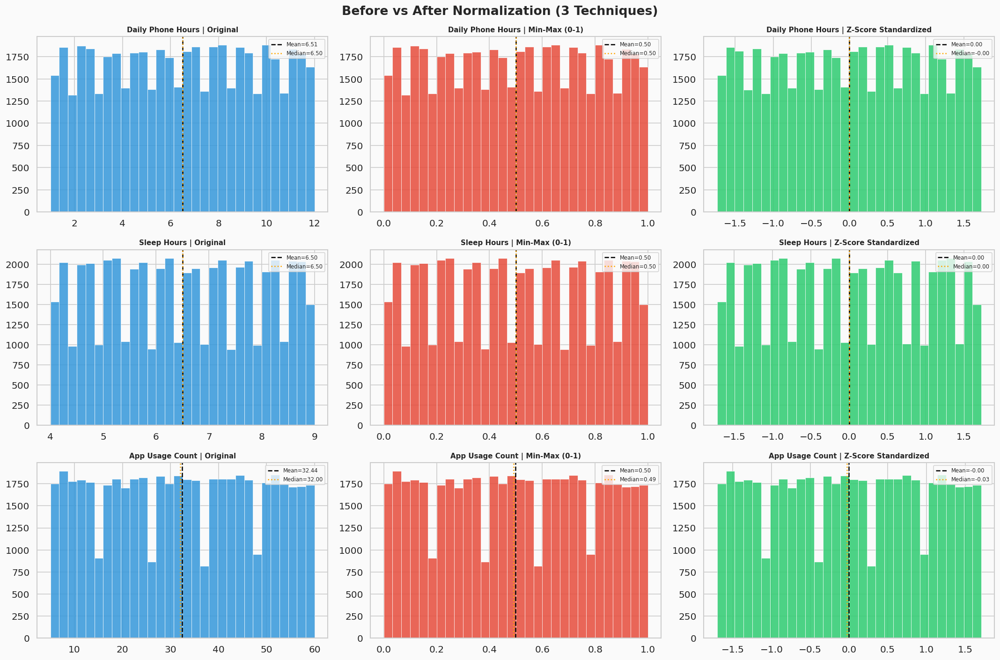

In [21]:
plot_cols = ['Daily_Phone_Hours','Sleep_Hours','App_Usage_Count']
fig, axes = plt.subplots(3, 3, figsize=(18, 12))
fig.suptitle('Before vs After Normalization (3 Techniques)', fontsize=16, fontweight='bold')
titles = ['Original','Min-Max (0-1)','Z-Score Standardized']
colors = ['#3498db','#e74c3c','#2ecc71']

for row, col in enumerate(plot_cols):
    dsets = [df_num[col], df_minmax[col+'_minmax'], df_zscore[col+'_zscore']]
    for c, (data, title, color) in enumerate(zip(dsets, titles, colors)):
        ax = axes[row][c]
        ax.hist(data, bins=30, color=color, edgecolor='white', linewidth=0.5, alpha=0.85)
        ax.axvline(data.mean(),   color='black',  linestyle='--', linewidth=1.5,
                   label=f'Mean={data.mean():.2f}')
        ax.axvline(data.median(), color='orange', linestyle=':',  linewidth=1.5,
                   label=f'Median={data.median():.2f}')
        ax.set_title(f'{col.replace("_"," ")} | {title}', fontsize=9)
        ax.legend(fontsize=7)

plt.tight_layout()
plt.show()

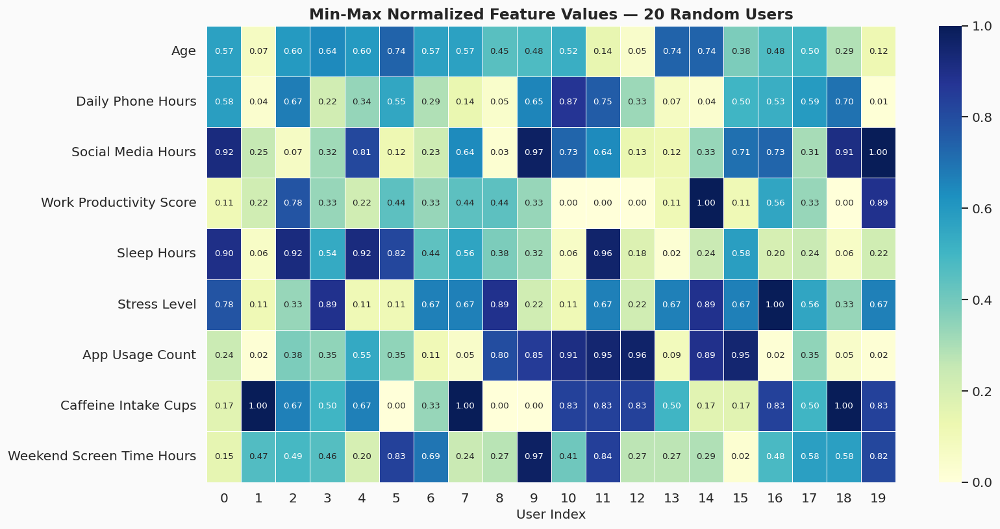

In [22]:
sample_norm = df_minmax.sample(20, random_state=42).reset_index(drop=True)
sample_norm.columns = [c.replace('_minmax','').replace('_',' ') for c in sample_norm.columns]

fig, ax = plt.subplots(figsize=(14, 7))
sns.heatmap(sample_norm.T, annot=True, fmt='.2f', cmap='YlGnBu',
            linewidths=0.4, linecolor='white', ax=ax, annot_kws={'size':8})
ax.set_title('Min-Max Normalized Feature Values — 20 Random Users',
             fontsize=14, fontweight='bold')
ax.set_xlabel('User Index')
plt.tight_layout()
plt.show()

---
## 6. Custom Functions & Feature Engineering <a id='6'></a>
> Innovative user-defined functions and derived features

In [23]:
# ═══════════════════════════════════════════════════════════════════════════
# CUSTOM FUNCTION LIBRARY
# ═══════════════════════════════════════════════════════════════════════════

def compute_digital_wellness_score(row):
    """
    Custom metric: Digital Wellness Score (0–100)
    Rewards: high sleep, low phone use, low stress, low social media
    Penalises: high caffeine, excessive screen time
    """
    sleep_score      = (row['Sleep_Hours'] / 12) * 25           # max 25 pts
    phone_penalty    = (row['Daily_Phone_Hours'] / 12) * 20     # max 20 pts penalty
    stress_penalty   = (row['Stress_Level'] / 10) * 25          # max 25 pts penalty
    social_penalty   = (row['Social_Media_Hours'] / 8) * 15     # max 15 pts penalty
    caffeine_penalty = (row['Caffeine_Intake_Cups'] / 10) * 15  # max 15 pts penalty
    score = 100 - phone_penalty - stress_penalty - social_penalty - caffeine_penalty + sleep_score
    return round(np.clip(score, 0, 100), 2)

def classify_sleep(hours):
    """Classify sleep quality based on recommended ranges."""
    if hours < 6:   return 'Sleep Deprived (<6h)'
    elif hours < 7: return 'Below Recommended (6-7h)'
    elif hours < 9: return 'Optimal (7-9h)'
    else:           return 'Excessive (>9h)'

def productivity_risk(row):
    """
    Custom risk flag: High Risk if stress is high AND sleep is low
    AND phone usage is very high.
    """
    if row['Stress_Level'] >= 7 and row['Sleep_Hours'] < 6 and row['Daily_Phone_Hours'] >= 8:
        return 'High Risk'
    elif row['Stress_Level'] >= 5 and row['Sleep_Hours'] < 7:
        return 'Moderate Risk'
    else:
        return 'Low Risk'

def screen_to_sleep_ratio(row):
    """How many hours of screen time per hour of sleep."""
    if row['Sleep_Hours'] == 0: return np.nan
    return round((row['Daily_Phone_Hours'] + row['Social_Media_Hours']) / row['Sleep_Hours'], 3)

def engagement_index(row):
    """Composite app engagement: combines app count and screen hours."""
    return round((row['App_Usage_Count'] * 0.4 + row['Total_Screen_Time'] * 5) / 2, 2)

print(' 5 custom functions defined!')
print('  1. compute_digital_wellness_score(row)')
print('  2. classify_sleep(hours)')
print('  3. productivity_risk(row)')
print('  4. screen_to_sleep_ratio(row)')
print('  5. engagement_index(row)')

 5 custom functions defined!
  1. compute_digital_wellness_score(row)
  2. classify_sleep(hours)
  3. productivity_risk(row)
  4. screen_to_sleep_ratio(row)
  5. engagement_index(row)


In [24]:
# ── Apply Custom Functions to Engineer New Features ───────────────────────────
df['Digital_Wellness_Score'] = df.apply(compute_digital_wellness_score, axis=1)
df['Sleep_Quality']          = df['Sleep_Hours'].apply(classify_sleep)
df['Productivity_Risk']      = df.apply(productivity_risk, axis=1)
df['Screen_Sleep_Ratio']     = df.apply(screen_to_sleep_ratio, axis=1)
df['Engagement_Index']       = df.apply(engagement_index, axis=1)

# ── Additional Engineered Features ───────────────────────────────────────────
df['Weekend_Weekday_Ratio']  = (df['Weekend_Screen_Time_Hours'] /
                                df['Daily_Phone_Hours'].replace(0, 0.1)).round(2)
df['Stress_Sleep_Product']   = df['Stress_Level'] * (1 / df['Sleep_Hours'].replace(0,1))
df['Is_Heavy_User']          = (df['Daily_Phone_Hours'] >= df['Daily_Phone_Hours'].quantile(0.75)).astype(int)
df['Productivity_Category']  = df['Work_Productivity_Score'].apply(
    lambda x: 'High' if x>=7 else ('Medium' if x>=4 else 'Low'))

print('Feature Engineering complete!')
print('New features added:')
new_feats = ['Digital_Wellness_Score','Sleep_Quality','Productivity_Risk',
             'Screen_Sleep_Ratio','Engagement_Index','Weekend_Weekday_Ratio',
             'Stress_Sleep_Product','Is_Heavy_User','Productivity_Category']
for f in new_feats: print(f'  • {f}')

df[new_feats].head()

Feature Engineering complete!
New features added:
  • Digital_Wellness_Score
  • Sleep_Quality
  • Productivity_Risk
  • Screen_Sleep_Ratio
  • Engagement_Index
  • Weekend_Weekday_Ratio
  • Stress_Sleep_Product
  • Is_Heavy_User
  • Productivity_Category


,Digital_Wellness_Score,Sleep_Quality,Productivity_Risk,Screen_Sleep_Ratio,Engagement_Index,Weekend_Weekday_Ratio,Stress_Sleep_Product,Is_Heavy_User,Productivity_Category
0,92.10,Optimal (7-9h),Low Risk,0.909,28.40,6.69,0.454545,0,Medium
1,100.00,Below Recommended (6-7h),Low Risk,0.422,16.95,4.25,0.156250,0,Medium
2,81.73,Excessive (>9h),Low Risk,1.222,30.30,1.19,0.444444,0,Medium
3,81.02,Sleep Deprived (<6h),Low Risk,1.456,27.95,2.21,0.526316,0,Low
4,81.27,Sleep Deprived (<6h),Low Risk,1.614,30.40,1.25,0.526316,0,Medium


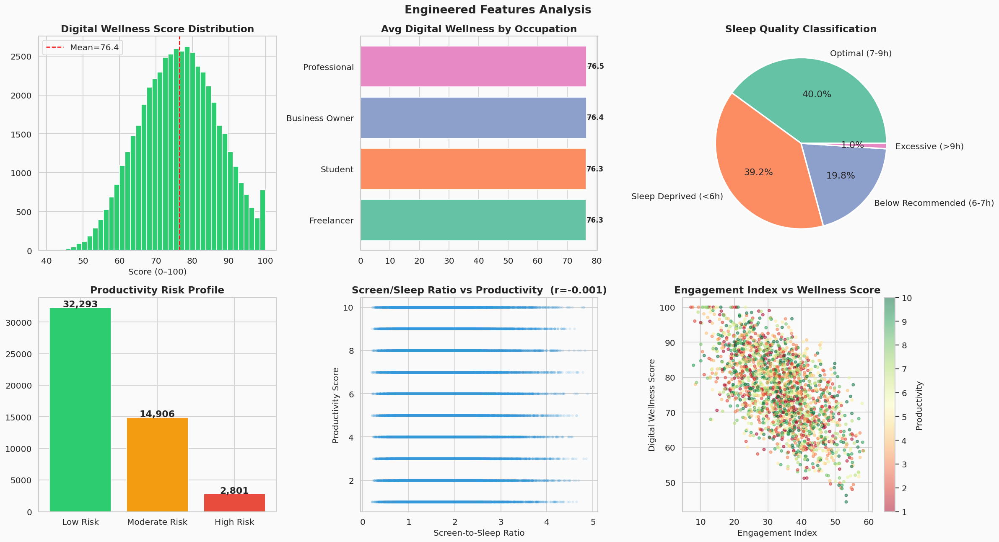

In [25]:
# ── Visualize Key Engineered Features ────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(20, 11))
fig.suptitle('Engineered Features Analysis', fontsize=16, fontweight='bold')

# 1. Digital Wellness Score Distribution
axes[0,0].hist(df['Digital_Wellness_Score'], bins=40, color='#2ecc71', edgecolor='white')
axes[0,0].axvline(df['Digital_Wellness_Score'].mean(), color='red', linestyle='--',
                   label=f'Mean={df["Digital_Wellness_Score"].mean():.1f}')
axes[0,0].set_title('Digital Wellness Score Distribution')
axes[0,0].set_xlabel('Score (0–100)'); axes[0,0].legend()

# 2. Wellness Score by Occupation
wbo = df.groupby('Occupation')['Digital_Wellness_Score'].mean().sort_values()
axes[0,1].barh(wbo.index, wbo.values, color=PALETTE[:4])
for i, v in enumerate(wbo.values):
    axes[0,1].text(v+0.2, i, f'{v:.1f}', va='center', fontweight='bold', fontsize=10)
axes[0,1].set_title('Avg Digital Wellness by Occupation')

# 3. Sleep Quality Distribution
sq = df['Sleep_Quality'].value_counts()
axes[0,2].pie(sq.values, labels=sq.index, autopct='%1.1f%%',
              colors=PALETTE, wedgeprops={'edgecolor':'white','linewidth':2})
axes[0,2].set_title('Sleep Quality Classification')

# 4. Productivity Risk Distribution
pr = df['Productivity_Risk'].value_counts()
colors_pr = ['#2ecc71','#f39c12','#e74c3c']
bars = axes[1,0].bar(pr.index, pr.values, color=colors_pr[:len(pr)], edgecolor='white')
for bar in bars:
    axes[1,0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+100,
                   f'{int(bar.get_height()):,}', ha='center', fontweight='bold')
axes[1,0].set_title('Productivity Risk Profile')

# 5. Screen-to-Sleep Ratio vs Productivity
axes[1,1].scatter(df['Screen_Sleep_Ratio'].clip(0,5), df['Work_Productivity_Score'],
                   alpha=0.1, s=8, color='#3498db')
r_ss, _ = pearsonr(df['Screen_Sleep_Ratio'].clip(0,5), df['Work_Productivity_Score'])
axes[1,1].set_title(f'Screen/Sleep Ratio vs Productivity  (r={r_ss:.3f})')
axes[1,1].set_xlabel('Screen-to-Sleep Ratio'); axes[1,1].set_ylabel('Productivity Score')

# 6. Engagement Index vs Wellness Score
sample = df.sample(2000, random_state=1)
sc = axes[1,2].scatter(sample['Engagement_Index'], sample['Digital_Wellness_Score'],
                        c=sample['Work_Productivity_Score'], cmap='RdYlGn', alpha=0.5, s=15)
plt.colorbar(sc, ax=axes[1,2], label='Productivity')
axes[1,2].set_title('Engagement Index vs Wellness Score')
axes[1,2].set_xlabel('Engagement Index'); axes[1,2].set_ylabel('Digital Wellness Score')

plt.tight_layout()
plt.show()

 Digital Wellness Score vs Work Productivity
   Pearson r = -0.0061  (p = 0.171396)



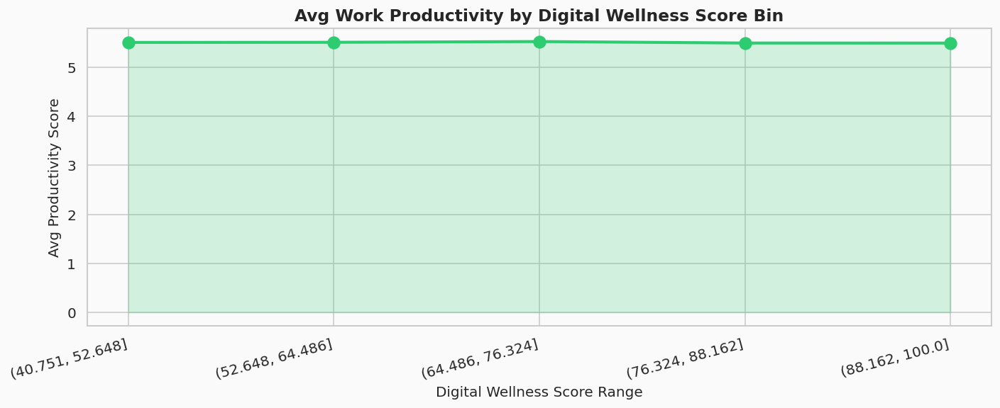

💡 Insight: Higher Digital Wellness Scores are associated with higher productivity.


In [26]:
# ── Insight: Digital Wellness Score vs Productivity ───────────────────────────
r_wl, p_wl = pearsonr(df['Digital_Wellness_Score'], df['Work_Productivity_Score'])
print(f' Digital Wellness Score vs Work Productivity')
print(f'   Pearson r = {r_wl:.4f}  (p = {p_wl:.6f})')
print()

wellness_bins = pd.cut(df['Digital_Wellness_Score'], bins=5)
wb_prod = df.groupby(wellness_bins, observed=True)['Work_Productivity_Score'].mean()

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(range(len(wb_prod)), wb_prod.values, 'o-', color='#2ecc71', linewidth=2.5, markersize=10)
ax.fill_between(range(len(wb_prod)), wb_prod.values, alpha=0.2, color='#2ecc71')
ax.set_xticks(range(len(wb_prod)))
ax.set_xticklabels([str(b) for b in wb_prod.index], rotation=15, ha='right')
ax.set_title('Avg Work Productivity by Digital Wellness Score Bin',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Digital Wellness Score Range'); ax.set_ylabel('Avg Productivity Score')
plt.tight_layout(); plt.show()

print('💡 Insight: Higher Digital Wellness Scores are associated with higher productivity.')

In [27]:
# ── DUMMY ENCODING: Gender ───────────────────────────────────────────────────
#
# pd.get_dummies(series, prefix, drop_first)
#   prefix      = label prefix so we know which original column each dummy came from
#   drop_first  = True → drop the first alphabetical category to avoid multicollinearity
#
# Gender has 3 categories → creates 2 dummy columns (Female is the dropped baseline)

gender_dummies = pd.get_dummies(df['Gender'], prefix='Gender', drop_first=True)

print('Dummy Encoding applied to: Gender')
print(f'  Original categories (k=3): {sorted(df["Gender"].unique())}')
print(f'  Columns created  (k-1=2): {list(gender_dummies.columns)}')
print(f'  Dropped baseline         : Female (first alphabetically)')
print()

# Show what every possible combination looks like
# When Gender_Male=0 AND Gender_Other=0 → user is Female (implicit baseline)
demo = pd.concat([df['Gender'], gender_dummies], axis=1).drop_duplicates().sort_values('Gender')
print('All unique Gender combinations:')
print(demo.reset_index(drop=True).to_string(index=False))


Dummy Encoding applied to: Gender
  Original categories (k=3): ['Female', 'Male', 'Other']
  Columns created  (k-1=2): ['Gender_Male', 'Gender_Other']
  Dropped baseline         : Female (first alphabetically)

All unique Gender combinations:
Gender  Gender_Male  Gender_Other
Female        False         False
  Male         True         False
 Other        False          True


In [28]:
# ── DUMMY ENCODING: Occupation ───────────────────────────────────────────────
#
# Occupation has 4 categories → creates 3 dummy columns
# Business Owner is dropped (first alphabetically) → it is the baseline

occ_dummies = pd.get_dummies(df['Occupation'], prefix='Occ', drop_first=True)

print('Dummy Encoding applied to: Occupation')
print(f'  Original categories (k=4): {sorted(df["Occupation"].unique())}')
print(f'  Columns created  (k-1=3): {list(occ_dummies.columns)}')
print(f'  Dropped baseline         : Business Owner')
print()

# Show all 4 combinations
demo_occ = pd.concat([df['Occupation'], occ_dummies], axis=1).drop_duplicates().sort_values('Occupation')
print('All unique Occupation combinations (Business Owner = all 0s):')
print(demo_occ.reset_index(drop=True).to_string(index=False))


Dummy Encoding applied to: Occupation
  Original categories (k=4): ['Business Owner', 'Freelancer', 'Professional', 'Student']
  Columns created  (k-1=3): ['Occ_Freelancer', 'Occ_Professional', 'Occ_Student']
  Dropped baseline         : Business Owner

All unique Occupation combinations (Business Owner = all 0s):
    Occupation  Occ_Freelancer  Occ_Professional  Occ_Student
Business Owner           False             False        False
    Freelancer            True             False        False
  Professional           False              True        False
       Student           False             False         True


In [29]:
# ── DUMMY ENCODING: Device_Type ──────────────────────────────────────────────
#
# Device_Type has 2 categories → creates only 1 dummy column
# Android is the baseline (first alphabetically); Device_iOS = 1 means iOS user

device_dummies = pd.get_dummies(df['Device_Type'], prefix='Device', drop_first=True)

print('Dummy Encoding applied to: Device_Type')
print(f'  Original categories (k=2): {sorted(df["Device_Type"].unique())}')
print(f'  Columns created  (k-1=1): {list(device_dummies.columns)}')
print(f'  Dropped baseline         : Android')
print()

demo_dev = pd.concat([df['Device_Type'], device_dummies], axis=1).drop_duplicates().sort_values('Device_Type')
print('All unique Device_Type combinations (Android = Device_iOS is 0):')
print(demo_dev.reset_index(drop=True).to_string(index=False))


Dummy Encoding applied to: Device_Type
  Original categories (k=2): ['Android', 'iOS']
  Columns created  (k-1=1): ['Device_iOS']
  Dropped baseline         : Android

All unique Device_Type combinations (Android = Device_iOS is 0):
Device_Type  Device_iOS
    Android       False
        iOS        True


In [30]:
# ── Attach all dummy columns to a working copy of the DataFrame ─────────────
#
# pd.concat([df, dummy1, dummy2, ...], axis=1) joins DataFrames side-by-side (column-wise)
# axis=1 means concatenate columns (axis=0 would stack rows)

df_dummy = pd.concat([df, gender_dummies, occ_dummies, device_dummies], axis=1)

all_dummy_cols = list(gender_dummies.columns) + list(occ_dummies.columns) + list(device_dummies.columns)
print(f'Original DataFrame: {df.shape}')
print(f'After adding {len(all_dummy_cols)} dummy columns: {df_dummy.shape}')
print(f'\nAll dummy columns created ({len(all_dummy_cols)} total):')
for col in all_dummy_cols:
    print(f'  • {col}')

print()
print('First 5 rows showing dummy columns:')
df_dummy[['Gender'] + list(gender_dummies.columns) +
         ['Occupation'] + list(occ_dummies.columns)].head()


Original DataFrame: (50000, 33)
After adding 6 dummy columns: (50000, 39)

All dummy columns created (6 total):
  • Gender_Male
  • Gender_Other
  • Occ_Freelancer
  • Occ_Professional
  • Occ_Student
  • Device_iOS

First 5 rows showing dummy columns:


,Gender,Gender_Male,Gender_Other,Occupation,Occ_Freelancer,Occ_Professional,Occ_Student
0,Male,True,False,Professional,False,True,False
1,Male,True,False,Professional,False,True,False
2,Male,True,False,Student,False,False,True
3,Female,False,False,Business Owner,False,False,False
4,Male,True,False,Freelancer,True,False,False


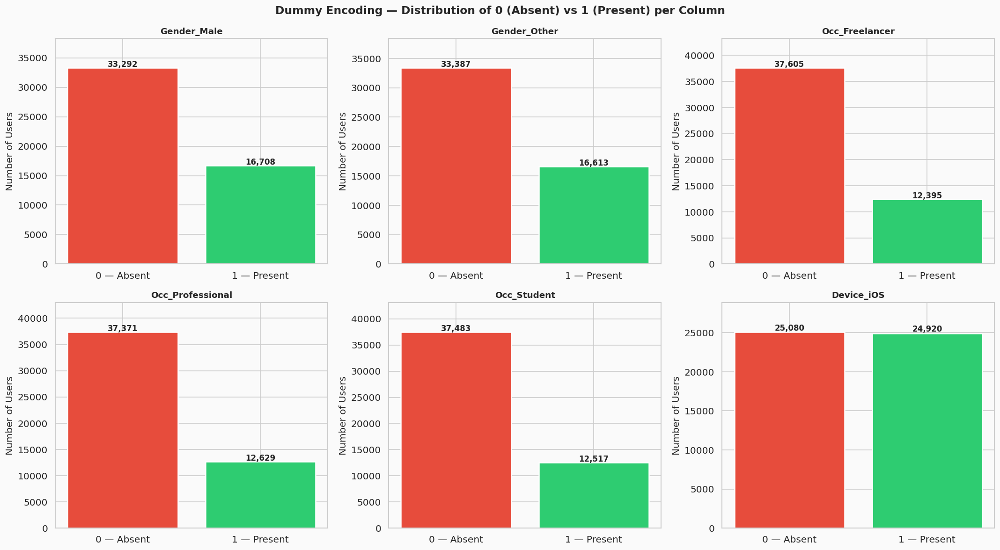

Key insight: Each column is purely binary — 0 means that category is absent, 1 means it is present.


In [31]:
# ── Visualise Dummy Encoded Columns ──────────────────────────────────────────
#
# For each dummy column we show how many rows have 0 (absent) vs 1 (present).
# This confirms the encoding is working correctly and the counts make sense.

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Dummy Encoding — Distribution of 0 (Absent) vs 1 (Present) per Column',
             fontsize=14, fontweight='bold')

for ax, col in zip(axes.flatten(), all_dummy_cols):
    counts = df_dummy[col].value_counts().sort_index()
    bars   = ax.bar(['0 — Absent', '1 — Present'], counts.values,
                    color=['#e74c3c', '#2ecc71'], edgecolor='white', linewidth=1.5)
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.set_ylabel('Number of Users')
    ax.set_ylim(0, counts.max() * 1.15)
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 200,
                f'{int(bar.get_height()):,}', ha='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()
print('Key insight: Each column is purely binary — 0 means that category is absent, 1 means it is present.')


In [32]:
# ── ONE-HOT ENCODING: Gender ─────────────────────────────────────────────────
#
# drop_first=False → ALL categories get their own binary column
# Every row will have exactly ONE column set to 1 and the rest set to 0.

ohe_gender = pd.get_dummies(df['Gender'], prefix='OHE_Gender', drop_first=False)

print('One-Hot Encoding applied to: Gender')
print(f'  Original categories (k=3): {sorted(df["Gender"].unique())}')
print(f'  Columns created      (k=3): {list(ohe_gender.columns)}')
print(f'  No category is dropped — all are explicit.')
print()

# Show all unique combinations — each row has exactly one 1
demo_ohe_g = pd.concat([df['Gender'], ohe_gender], axis=1).drop_duplicates().sort_values('Gender')
print('All unique Gender combinations (row sum always = 1):')
print(demo_ohe_g.reset_index(drop=True).to_string(index=False))

# Verify row sums = 1 for every single row
row_sums = ohe_gender.sum(axis=1)  # axis=1 = sum across columns (per row)
print(f'\nRow sum verification:')
print(f'  Minimum row sum = {row_sums.min()}')
print(f'  Maximum row sum = {row_sums.max()}')
print(f'  All rows sum to 1: {(row_sums == 1).all()}')


One-Hot Encoding applied to: Gender
  Original categories (k=3): ['Female', 'Male', 'Other']
  Columns created      (k=3): ['OHE_Gender_Female', 'OHE_Gender_Male', 'OHE_Gender_Other']
  No category is dropped — all are explicit.

All unique Gender combinations (row sum always = 1):
Gender  OHE_Gender_Female  OHE_Gender_Male  OHE_Gender_Other
Female               True            False             False
  Male              False             True             False
 Other              False            False              True

Row sum verification:
  Minimum row sum = 1
  Maximum row sum = 1
  All rows sum to 1: True


In [33]:
# ── ONE-HOT ENCODING: Occupation ─────────────────────────────────────────────
#
# 4 unique categories → 4 binary columns
# Business Owner, Freelancer, Professional, Student each get their own column

ohe_occ = pd.get_dummies(df['Occupation'], prefix='OHE_Occ', drop_first=False)

print('One-Hot Encoding applied to: Occupation')
print(f'  Original categories (k=4): {sorted(df["Occupation"].unique())}')
print(f'  Columns created      (k=4): {list(ohe_occ.columns)}')
print()

# Show all 4 combinations
demo_occ = pd.concat([df['Occupation'], ohe_occ], axis=1).drop_duplicates().sort_values('Occupation')
print('All unique Occupation combinations:')
print(demo_occ.reset_index(drop=True).to_string(index=False))

# Row sum verification
row_sums_occ = ohe_occ.sum(axis=1)
print(f'\nRow sum check — all must equal 1:')
print(f'  Min = {row_sums_occ.min()}   Max = {row_sums_occ.max()}   All correct: {(row_sums_occ == 1).all()}')


One-Hot Encoding applied to: Occupation
  Original categories (k=4): ['Business Owner', 'Freelancer', 'Professional', 'Student']
  Columns created      (k=4): ['OHE_Occ_Business Owner', 'OHE_Occ_Freelancer', 'OHE_Occ_Professional', 'OHE_Occ_Student']

All unique Occupation combinations:
    Occupation  OHE_Occ_Business Owner  OHE_Occ_Freelancer  OHE_Occ_Professional  OHE_Occ_Student
Business Owner                    True               False                 False            False
    Freelancer                   False                True                 False            False
  Professional                   False               False                  True            False
       Student                   False               False                 False             True

Row sum check — all must equal 1:
  Min = 1   Max = 1   All correct: True


In [34]:
# ── ONE-HOT ENCODING: Device_Type ────────────────────────────────────────────
#
# 2 unique categories → 2 binary columns
# With only 2 categories, one-hot and dummy produce similar results
# but one-hot keeps both columns explicitly visible

ohe_device = pd.get_dummies(df['Device_Type'], prefix='OHE_Device', drop_first=False)

print('One-Hot Encoding applied to: Device_Type')
print(f'  Original categories (k=2): {sorted(df["Device_Type"].unique())}')
print(f'  Columns created      (k=2): {list(ohe_device.columns)}')
print()

demo_dev = pd.concat([df['Device_Type'], ohe_device], axis=1).drop_duplicates().sort_values('Device_Type')
print('All unique Device_Type combinations:')
print(demo_dev.reset_index(drop=True).to_string(index=False))


One-Hot Encoding applied to: Device_Type
  Original categories (k=2): ['Android', 'iOS']
  Columns created      (k=2): ['OHE_Device_Android', 'OHE_Device_iOS']

All unique Device_Type combinations:
Device_Type  OHE_Device_Android  OHE_Device_iOS
    Android                True           False
        iOS               False            True


In [35]:
# ── Attach all OHE columns to a working copy ─────────────────────────────────
#
# pd.concat with axis=1 joins DataFrames side-by-side (adds columns)

df_ohe = pd.concat([df, ohe_gender, ohe_occ, ohe_device], axis=1)

all_ohe_cols = list(ohe_gender.columns) + list(ohe_occ.columns) + list(ohe_device.columns)

print(f'Original DataFrame: {df.shape}')
print(f'After adding {len(all_ohe_cols)} OHE columns: {df_ohe.shape}')
print(f'\nAll OHE columns created ({len(all_ohe_cols)} total):')
for col in all_ohe_cols:
    print(f'  • {col}')


Original DataFrame: (50000, 33)
After adding 9 OHE columns: (50000, 42)

All OHE columns created (9 total):
  • OHE_Gender_Female
  • OHE_Gender_Male
  • OHE_Gender_Other
  • OHE_Occ_Business Owner
  • OHE_Occ_Freelancer
  • OHE_Occ_Professional
  • OHE_Occ_Student
  • OHE_Device_Android
  • OHE_Device_iOS


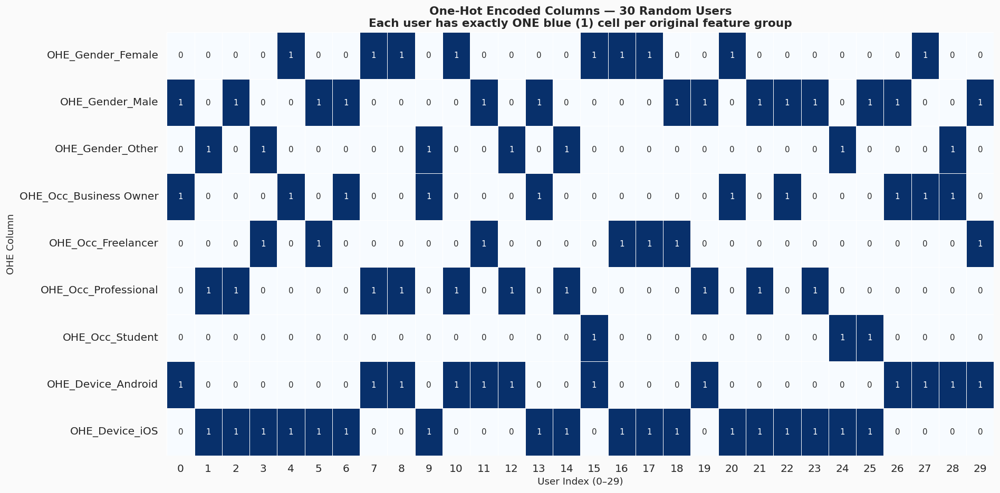

Observation: In each original feature group (Gender, Occupation, Device),
every user has exactly one column = 1 and all others = 0.


In [36]:
# ── OHE Heatmap: Show Encoding for 30 Random Users ──────────────────────────
#
# A heatmap of the OHE columns for 30 users makes the 'one-hot' pattern very clear.
# Each user has exactly ONE blue cell (value = 1) per original feature group.
# All other cells in the same group are white (value = 0).

sample_ohe = pd.concat([ohe_gender, ohe_occ, ohe_device], axis=1)
sample_ohe = sample_ohe.sample(30, random_state=42).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(16, 8))
# cmap='Blues': 0 = white (absent), 1 = dark blue (present)
# annot=True: print the 0 or 1 inside every cell
# fmt='d': integer format (no decimal point)
# linewidths: thin white borders between cells make the grid readable
sns.heatmap(sample_ohe.T,
            cmap='Blues', linewidths=0.4, linecolor='white',
            ax=ax, cbar=False, annot=True, fmt='d', annot_kws={'size': 9})
ax.set_title(
    'One-Hot Encoded Columns — 30 Random Users\n'
    'Each user has exactly ONE blue (1) cell per original feature group',
    fontsize=13, fontweight='bold'
)
ax.set_xlabel('User Index (0–29)', fontsize=11)
ax.set_ylabel('OHE Column', fontsize=11)
plt.tight_layout()
plt.show()

print('Observation: In each original feature group (Gender, Occupation, Device),')
print('every user has exactly one column = 1 and all others = 0.')


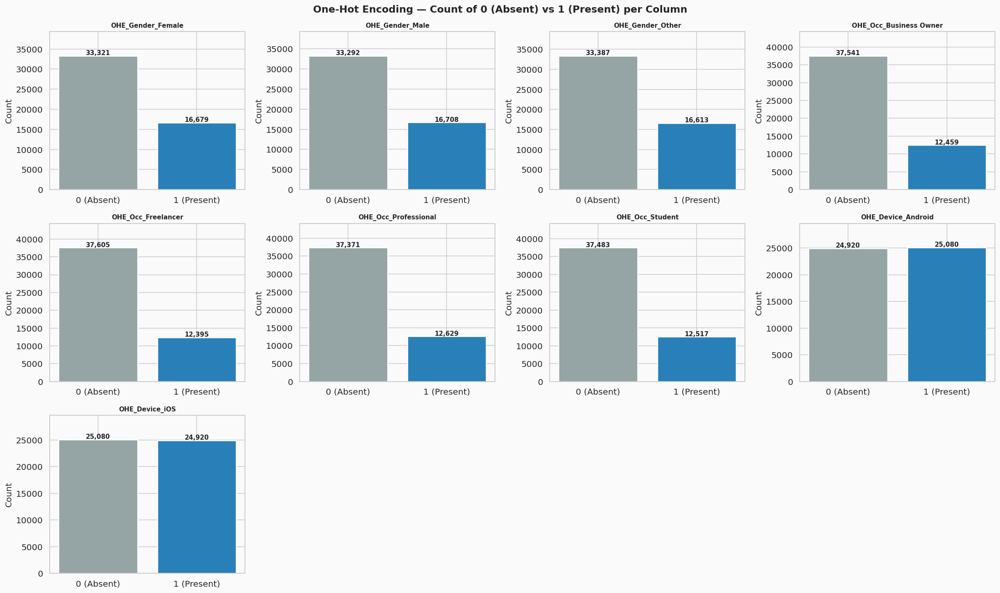

In [37]:
# ── Bar Charts for Each OHE Column ───────────────────────────────────────────
#
# For each OHE column, we show the count of 0s and 1s.
# This confirms that the encoding is correct and counts match the original categories.

n_cols = len(all_ohe_cols)
ncols_grid = 4
nrows_grid = (n_cols + ncols_grid - 1) // ncols_grid

fig, axes = plt.subplots(nrows_grid, ncols_grid, figsize=(20, nrows_grid * 4))
fig.suptitle('One-Hot Encoding — Count of 0 (Absent) vs 1 (Present) per Column',
             fontsize=14, fontweight='bold')

for ax, col in zip(axes.flatten(), all_ohe_cols):
    counts = df_ohe[col].value_counts().sort_index()
    bars   = ax.bar(['0 (Absent)', '1 (Present)'], counts.values,
                    color=['#95a5a6', '#2980b9'], edgecolor='white', linewidth=1.5)
    ax.set_title(col, fontsize=9, fontweight='bold')
    ax.set_ylabel('Count')
    ax.set_ylim(0, counts.max() * 1.18)
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 200,
                f'{int(bar.get_height()):,}', ha='center', fontsize=9, fontweight='bold')

# Hide unused axes
for ax in axes.flatten()[n_cols:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


---
## 7. NumPy & Pandas Operations <a id='7'></a>

In [38]:
# ── NumPy Statistical Operations ─────────────────────────────────────────────
phone_arr  = df['Daily_Phone_Hours'].to_numpy()
sleep_arr  = df['Sleep_Hours'].to_numpy()
stress_arr = df['Stress_Level'].to_numpy()

print('NumPy Operations on Daily Phone Hours')
print('='*45)
for func, val in [
    ('np.mean',    np.mean(phone_arr)),
    ('np.median',  np.median(phone_arr)),
    ('np.std',     np.std(phone_arr)),
    ('np.var',     np.var(phone_arr)),
    ('np.min',     np.min(phone_arr)),
    ('np.max',     np.max(phone_arr)),
    ('np.ptp',     np.ptp(phone_arr)),
]:
    print(f'  {func:<15s} = {val:.4f}')

print('\nPercentiles of Sleep Hours:')
for p in [10, 25, 50, 75, 90]:
    print(f'  {p}th = {np.percentile(sleep_arr, p):.2f}')

# np.corrcoef
mat = np.corrcoef([phone_arr, sleep_arr, stress_arr])
print('\nnp.corrcoef (Phone, Sleep, Stress):')
print(pd.DataFrame(mat, index=['Phone','Sleep','Stress'],
                   columns=['Phone','Sleep','Stress']).round(4))

# Boolean mask + np.where
high_stress = np.where(stress_arr >= 8, 'High Stress', 'Normal')
print(f'\nnp.where — High Stress users: {(stress_arr >= 8).sum():,}')

# np.log1p
log_app = np.log1p(df['App_Usage_Count'].values)
print(f'np.log1p(App_Usage) mean={log_app.mean():.3f}, std={log_app.std():.3f}')

# np.clip
clipped = np.clip(sleep_arr, 4, 10)
print(f'np.clip(Sleep, 4, 10): min={clipped.min()}, max={clipped.max()}')

# np.histogram
counts, edges = np.histogram(df['Sleep_Hours'], bins=8)
print('\nnp.histogram — Sleep Hours:')
for i, c in enumerate(counts):
    print(f'  {edges[i]:.1f}-{edges[i+1]:.1f} h : {c:,} users')

NumPy Operations on Daily Phone Hours
  np.mean         = 6.5091
  np.median       = 6.5000
  np.std          = 3.1709
  np.var          = 10.0544
  np.min          = 1.0000
  np.max          = 12.0000
  np.ptp          = 11.0000

Percentiles of Sleep Hours:
  10th = 4.50
  25th = 5.20
  50th = 6.50
  75th = 7.80
  90th = 8.50

np.corrcoef (Phone, Sleep, Stress):
         Phone   Sleep  Stress
Phone   1.0000 -0.0034 -0.0028
Sleep  -0.0034  1.0000  0.0047
Stress -0.0028  0.0047  1.0000

np.where — High Stress users: 15,017
np.log1p(App_Usage) mean=3.355, std=0.609
np.clip(Sleep, 4, 10): min=4.0, max=9.0

np.histogram — Sleep Hours:
  4.0-4.6 h : 6,531 users
  4.6-5.2 h : 6,129 users
  5.2-5.9 h : 6,007 users
  5.9-6.5 h : 5,991 users
  6.5-7.1 h : 6,795 users
  7.1-7.8 h : 5,989 users
  7.8-8.4 h : 5,948 users
  8.4-9.0 h : 6,610 users


In [39]:
# ── Pandas Key Operations ─────────────────────────────────────────────────────
print('Pandas groupby + agg:')
occ_agg = df.groupby('Occupation').agg(
    Users            = ('User_ID','count'),
    Avg_Productivity = ('Work_Productivity_Score','mean'),
    Avg_Stress       = ('Stress_Level','mean'),
    Avg_Phone        = ('Daily_Phone_Hours','mean'),
    Avg_Sleep        = ('Sleep_Hours','mean'),
    Avg_Wellness     = ('Digital_Wellness_Score','mean')
).round(2)
print(occ_agg)

print('\nPandas pivot_table:')
pt = df.pivot_table(values='Work_Productivity_Score',
                    index='Gender', columns='Device_Type', aggfunc=np.mean).round(2)
print(pt)

print('\nRelative frequency (Occupation):')
print((df['Occupation'].value_counts(normalize=True)*100).round(1).to_frame('% Share'))

# Rolling mean
df_s = df.sort_values('Age').reset_index(drop=True)
df_s['Prod_Rolling'] = df_s['Work_Productivity_Score'].rolling(500, min_periods=1).mean()

# Crosstab
print('\nCrosstab: Stress Category × Productivity Level:')
print(pd.crosstab(df['Stress_Category'], df['Productivity_Level'], margins=True))

Pandas groupby + agg:
                Users  Avg_Productivity  Avg_Stress  Avg_Phone  Avg_Sleep  \
Occupation                                                                  
Business Owner  12459              5.50        5.47       6.54       6.49   
Freelancer      12395              5.51        5.49       6.51       6.49   
Professional    12629              5.53        5.50       6.49       6.52   
Student         12517              5.48        5.55       6.49       6.50   

                Avg_Wellness  
Occupation                    
Business Owner         76.42  
Freelancer             76.30  
Professional           76.53  
Student                76.31  

Pandas pivot_table:
Device_Type  Android   iOS
Gender                    
Female          5.54  5.48
Male            5.51  5.47
Other           5.55  5.46

Relative frequency (Occupation):
                % Share
Occupation             
Professional       25.3
Student            25.0
Business Owner     24.9
Freelancer         

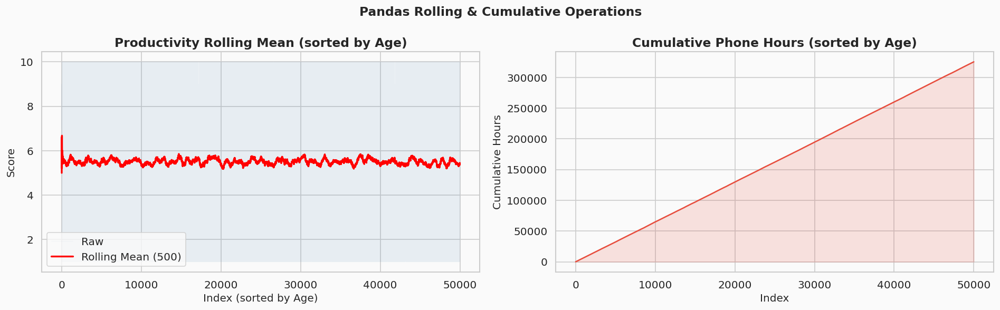

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Pandas Rolling & Cumulative Operations', fontsize=14, fontweight='bold')

axes[0].plot(df_s.index, df_s['Work_Productivity_Score'], alpha=0.1,
             color='steelblue', linewidth=0.3, label='Raw')
axes[0].plot(df_s.index, df_s['Prod_Rolling'], color='red',
             linewidth=2, label='Rolling Mean (500)')
axes[0].set_title('Productivity Rolling Mean (sorted by Age)')
axes[0].set_xlabel('Index (sorted by Age)'); axes[0].set_ylabel('Score'); axes[0].legend()

axes[1].plot(df_s.index, df_s['Daily_Phone_Hours'].cumsum(), color='#e74c3c', linewidth=1.5)
axes[1].fill_between(df_s.index, df_s['Daily_Phone_Hours'].cumsum(), alpha=0.15, color='#e74c3c')
axes[1].set_title('Cumulative Phone Hours (sorted by Age)')
axes[1].set_xlabel('Index'); axes[1].set_ylabel('Cumulative Hours')

plt.tight_layout(); plt.show()

---
## 8. Univariate Analysis <a id='8'></a>
> Distribution of each variable individually.

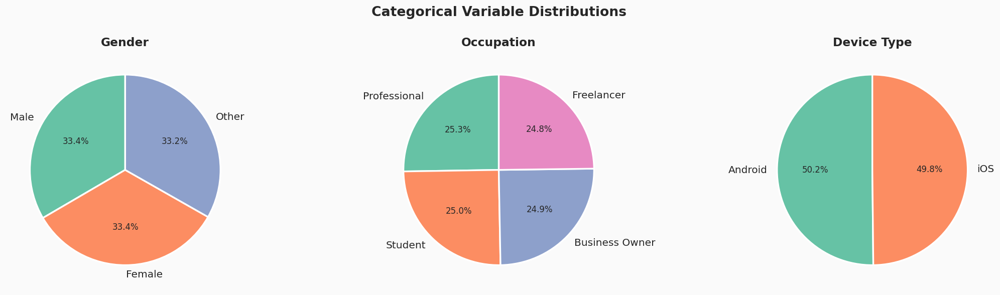

In [41]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Categorical Variable Distributions', fontsize=16, fontweight='bold')
for ax, (col, colors) in zip(axes, [('Gender',PALETTE[:3]),
                                      ('Occupation',PALETTE[:4]),
                                      ('Device_Type',PALETTE[:2])]):
    counts = df[col].value_counts()
    wedges,_,at = ax.pie(counts.values, labels=counts.index, autopct='%1.1f%%',
                          colors=colors, startangle=90,
                          wedgeprops={'edgecolor':'white','linewidth':2})
    for a in at: a.set_fontsize(10)
    ax.set_title(col.replace('_',' '))
plt.tight_layout(); plt.show()

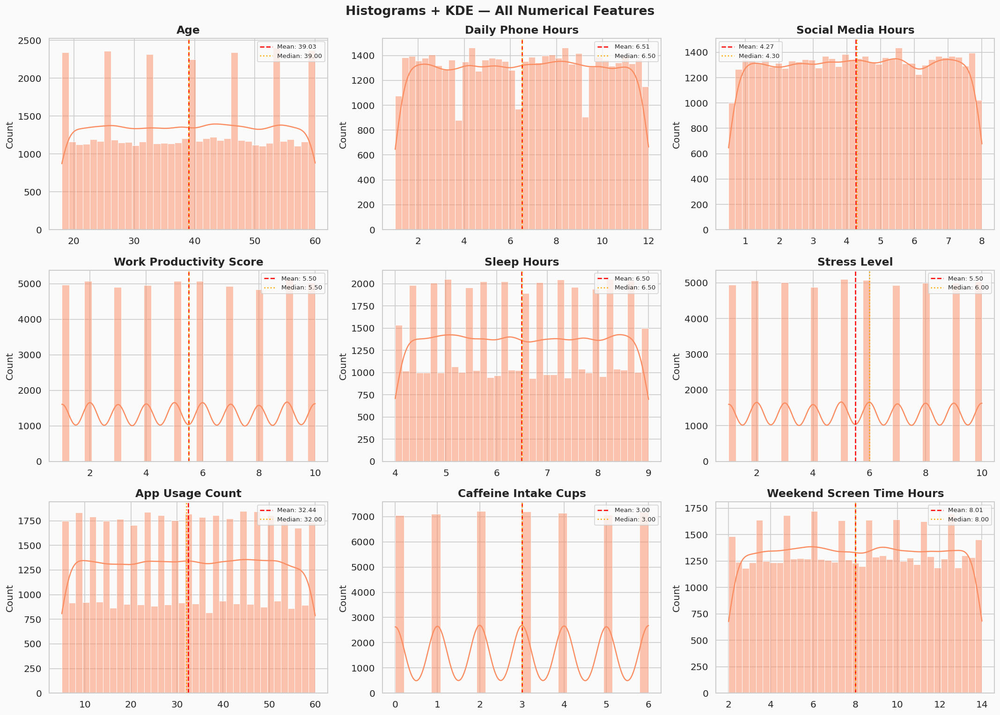

In [42]:
num_features = ['Age','Daily_Phone_Hours','Social_Media_Hours','Work_Productivity_Score',
                'Sleep_Hours','Stress_Level','App_Usage_Count','Caffeine_Intake_Cups',
                'Weekend_Screen_Time_Hours']

fig, axes = plt.subplots(3, 3, figsize=(18, 13))
fig.suptitle('Histograms + KDE — All Numerical Features', fontsize=16, fontweight='bold')
for ax, col in zip(axes.flatten(), num_features):
    sns.histplot(df[col], kde=True, ax=ax, color=PALETTE[1], edgecolor='white', linewidth=0.5)
    ax.axvline(df[col].mean(),   color='red',    linestyle='--', linewidth=1.5,
               label=f'Mean: {df[col].mean():.2f}')
    ax.axvline(df[col].median(), color='orange', linestyle=':',  linewidth=1.5,
               label=f'Median: {df[col].median():.2f}')
    ax.set_title(col.replace('_',' ')); ax.set_xlabel(''); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

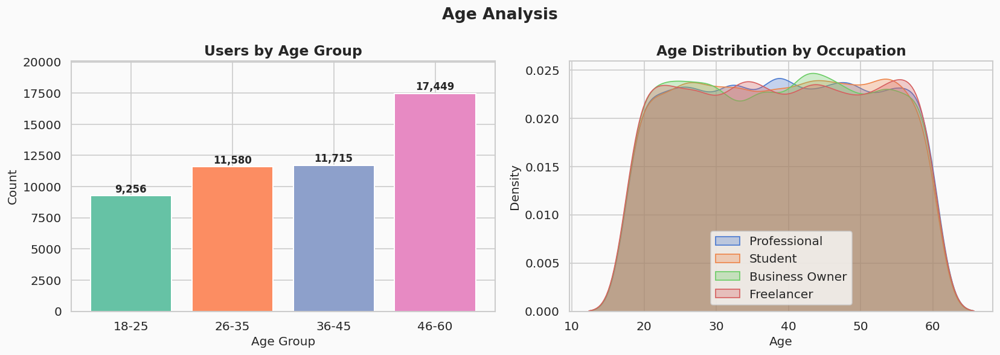

In [43]:
 # ── Age Group Distribution ──
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Age Analysis', fontsize=16, fontweight='bold')

# Bar chart
age_counts = df['Age_Group'].value_counts().sort_index()
bars = axes[0].bar(age_counts.index, age_counts.values, color=PALETTE, edgecolor='white', linewidth=1.2)
for bar in bars:
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 100,
                 f'{bar.get_height():,}', ha='center', va='bottom', fontsize=10, fontweight='bold')
axes[0].set_title('Users by Age Group')
axes[0].set_xlabel('Age Group')
axes[0].set_ylabel('Count')
axes[0].set_ylim(0, age_counts.max() * 1.15)

# KDE
for occ in df['Occupation'].unique():
    sns.kdeplot(df[df['Occupation'] == occ]['Age'], ax=axes[1], label=occ, fill=True, alpha=0.3)
axes[1].set_title('Age Distribution by Occupation')
axes[1].set_xlabel('Age')
axes[1].legend()

plt.tight_layout()
plt.show()

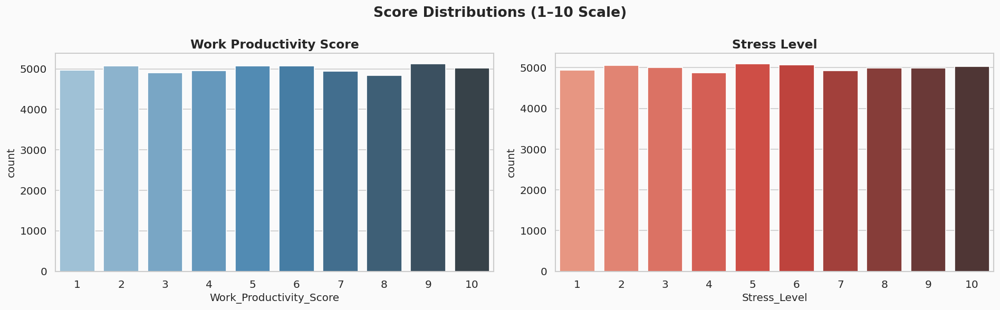

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Score Distributions (1–10 Scale)', fontsize=16, fontweight='bold')
sns.countplot(x='Work_Productivity_Score', data=df, ax=axes[0], palette='Blues_d', order=range(1,11))
axes[0].set_title('Work Productivity Score')
sns.countplot(x='Stress_Level', data=df, ax=axes[1], palette='Reds_d', order=range(1,11))
axes[1].set_title('Stress Level')
plt.tight_layout(); plt.show()

---
## 9. Bivariate Analysis <a id='9'></a>
> Relationships between pairs of variables.

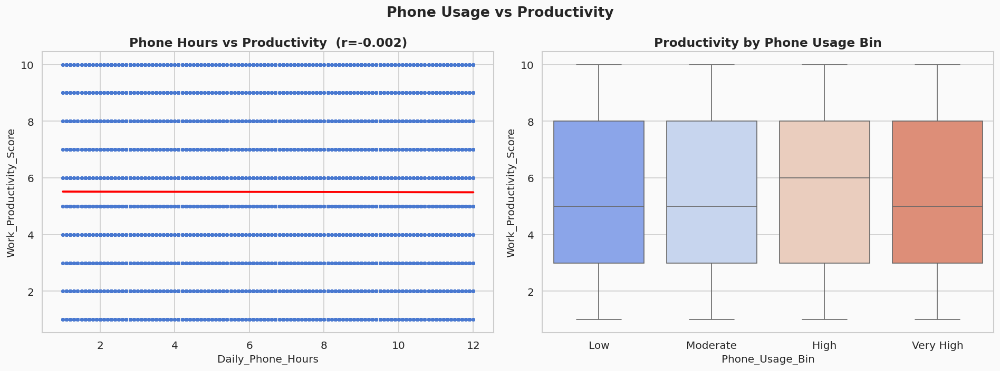

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Phone Usage vs Productivity', fontsize=16, fontweight='bold')
sns.regplot(x='Daily_Phone_Hours',y='Work_Productivity_Score',data=df,ax=axes[0],
            scatter_kws={'alpha':0.15,'s':10},line_kws={'color':'red'})
r,_=pearsonr(df['Daily_Phone_Hours'],df['Work_Productivity_Score'])
axes[0].set_title(f'Phone Hours vs Productivity  (r={r:.3f})')
sns.boxplot(x='Phone_Usage_Bin',y='Work_Productivity_Score',data=df,ax=axes[1],palette='coolwarm')
axes[1].set_title('Productivity by Phone Usage Bin')
plt.tight_layout(); plt.show()

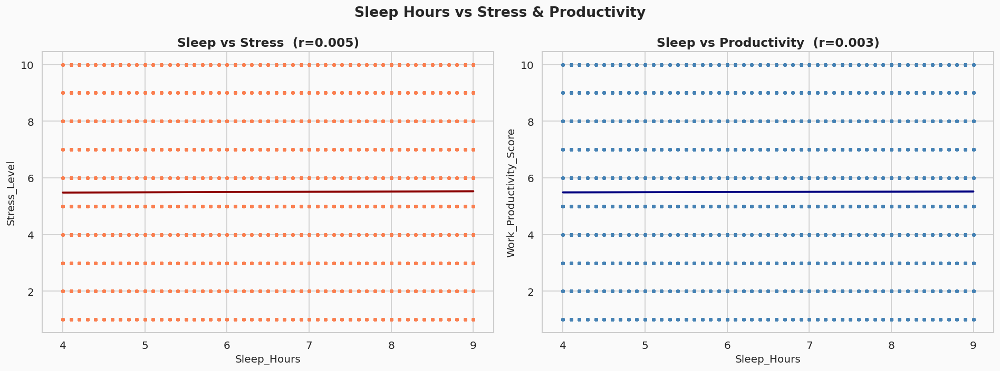

In [46]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Sleep Hours vs Stress & Productivity', fontsize=16, fontweight='bold')
sns.regplot(x='Sleep_Hours',y='Stress_Level',data=df,ax=axes[0],
            scatter_kws={'alpha':0.15,'s':10,'color':'coral'},line_kws={'color':'darkred'})
r1,_=pearsonr(df['Sleep_Hours'],df['Stress_Level'])
axes[0].set_title(f'Sleep vs Stress  (r={r1:.3f})')
sns.regplot(x='Sleep_Hours',y='Work_Productivity_Score',data=df,ax=axes[1],
            scatter_kws={'alpha':0.15,'s':10,'color':'steelblue'},line_kws={'color':'navy'})
r2,_=pearsonr(df['Sleep_Hours'],df['Work_Productivity_Score'])
axes[1].set_title(f'Sleep vs Productivity  (r={r2:.3f})')
plt.tight_layout(); plt.show()

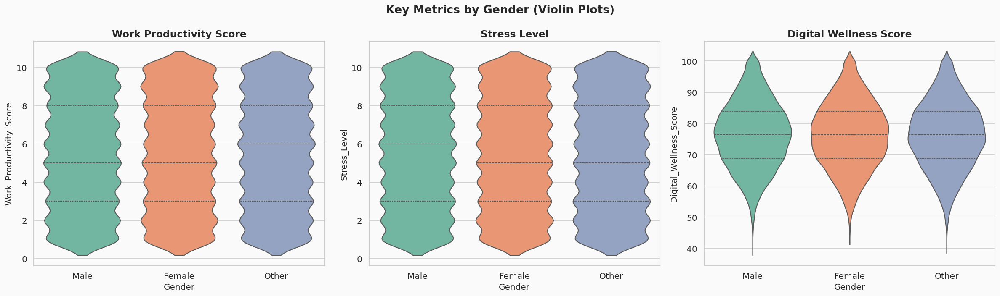

In [47]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Key Metrics by Gender (Violin Plots)', fontsize=16, fontweight='bold')
for ax, col in zip(axes,['Work_Productivity_Score','Stress_Level','Digital_Wellness_Score']):
    sns.violinplot(x='Gender',y=col,data=df,ax=ax,palette='Set2',inner='quartile')
    ax.set_title(col.replace('_',' '))
plt.tight_layout(); plt.show()

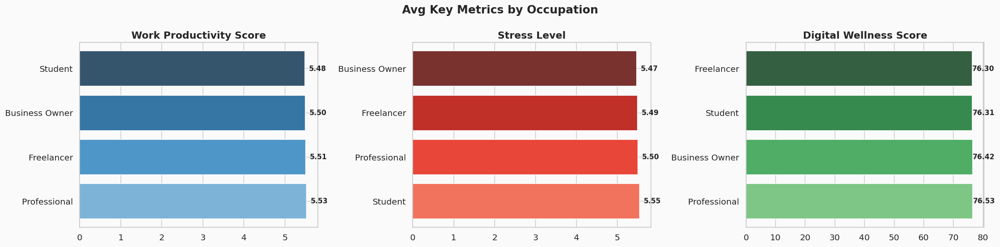

In [48]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
fig.suptitle('Avg Key Metrics by Occupation', fontsize=16, fontweight='bold')
for ax, col, cmap in zip(axes,
    ['Work_Productivity_Score','Stress_Level','Digital_Wellness_Score'],
    ['Blues_d','Reds_d','Greens_d']):
    means = df.groupby('Occupation')[col].mean().sort_values(ascending=False)
    bars  = ax.barh(means.index, means.values, color=sns.color_palette(cmap,len(means)))
    for b in bars:
        ax.text(b.get_width()+0.1,b.get_y()+b.get_height()/2,
                f'{b.get_width():.2f}',va='center',fontsize=10,fontweight='bold')
    ax.set_title(col.replace('_',' '))
plt.tight_layout(); plt.show()

---
## 10. Multivariate Analysis <a id='10'></a>
> Three or more variables simultaneously.

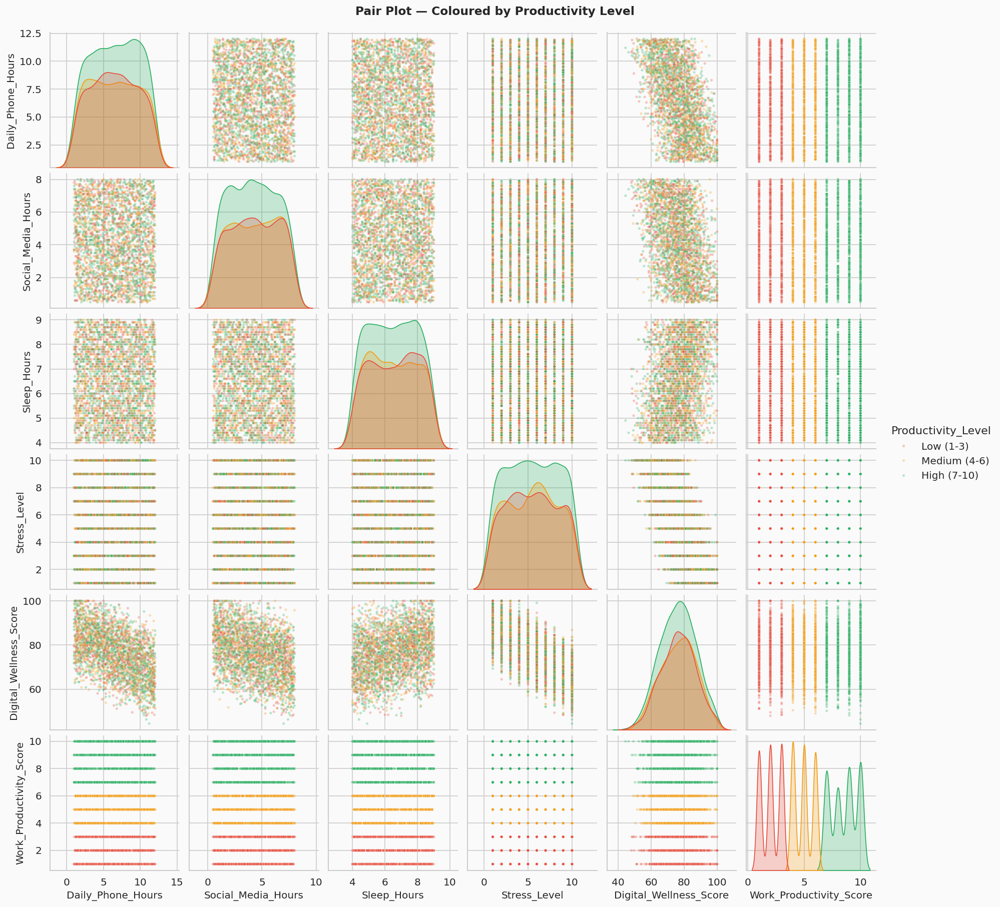

In [49]:
pair_cols = ['Daily_Phone_Hours','Social_Media_Hours','Sleep_Hours',
             'Stress_Level','Digital_Wellness_Score','Work_Productivity_Score']
g = sns.pairplot(df[pair_cols+['Productivity_Level']].sample(3000,random_state=1),
                 hue='Productivity_Level',
                 palette={'Low (1-3)':'#e74c3c','Medium (4-6)':'#f39c12','High (7-10)':'#27ae60'},
                 diag_kind='kde', plot_kws={'alpha':0.3,'s':10})
g.fig.suptitle('Pair Plot — Coloured by Productivity Level',
               fontsize=14, y=1.01, fontweight='bold')
plt.show()

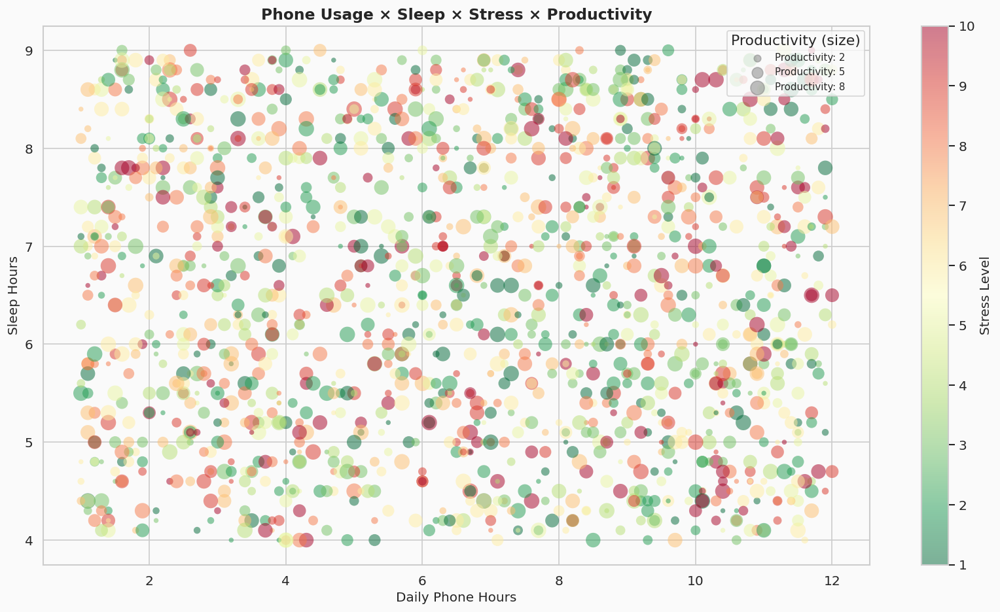

In [50]:
sample = df.sample(1500, random_state=42)
fig, ax = plt.subplots(figsize=(14, 8))
sc = ax.scatter(sample['Daily_Phone_Hours'], sample['Sleep_Hours'],
                c=sample['Stress_Level'], s=sample['Work_Productivity_Score']*20,
                alpha=0.5, cmap='RdYlGn_r', edgecolors='none')
plt.colorbar(sc, ax=ax, label='Stress Level')
for sv in [2,5,8]: ax.scatter([],[],s=sv*20,c='grey',alpha=0.5,label=f'Productivity: {sv}')
ax.legend(title='Productivity (size)', loc='upper right', fontsize=9)
ax.set_xlabel('Daily Phone Hours'); ax.set_ylabel('Sleep Hours')
ax.set_title('Phone Usage × Sleep × Stress × Productivity',fontsize=14,fontweight='bold')
plt.tight_layout(); plt.show()

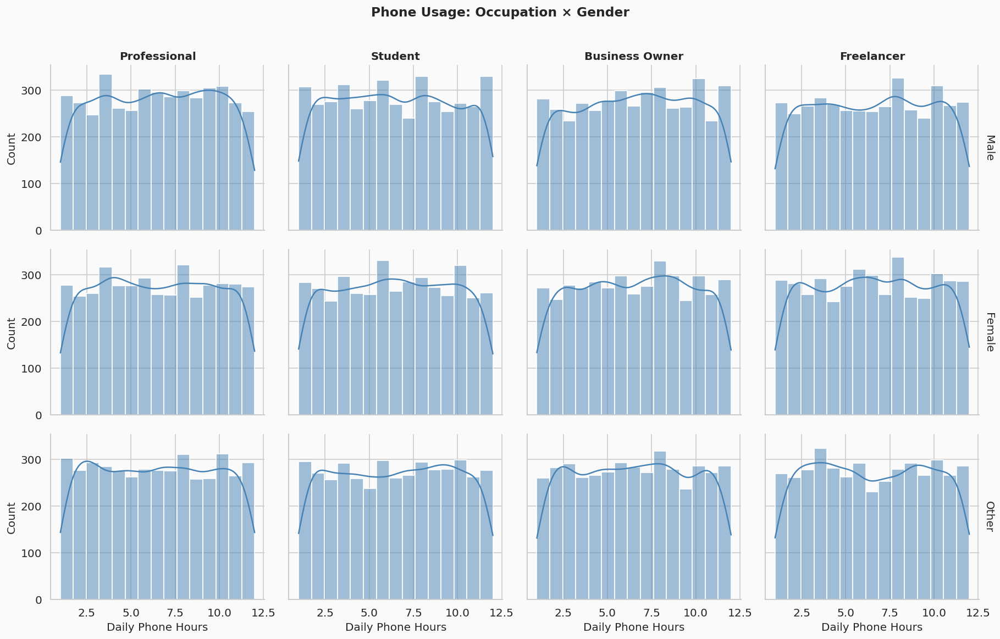

In [51]:
g = sns.FacetGrid(df, col='Occupation', row='Gender', height=3.2, aspect=1.2,
                  margin_titles=True)
g.map(sns.histplot, 'Daily_Phone_Hours', kde=True, color='steelblue', bins=15)
g.set_axis_labels('Daily Phone Hours','Count')
g.set_titles(col_template='{col_name}', row_template='{row_name}')
g.fig.suptitle('Phone Usage: Occupation × Gender', fontsize=14, y=1.01, fontweight='bold')
plt.tight_layout(); plt.show()

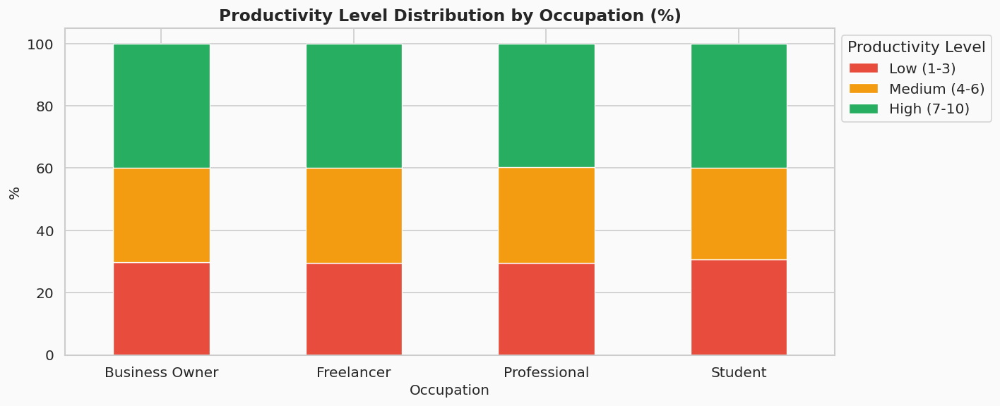

In [52]:
ct = pd.crosstab(df['Occupation'], df['Productivity_Level'], normalize='index')*100
fig, ax = plt.subplots(figsize=(12, 5))
ct.plot(kind='bar', stacked=True, ax=ax,
        color=['#e74c3c','#f39c12','#27ae60'], edgecolor='white', linewidth=0.8)
ax.set_title('Productivity Level Distribution by Occupation (%)',fontsize=14,fontweight='bold')
ax.set_xlabel('Occupation'); ax.set_ylabel('%')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.legend(title='Productivity Level', bbox_to_anchor=(1,1))
plt.tight_layout(); plt.show()

---
## 11. Specialized Visualizations <a id='11'></a>

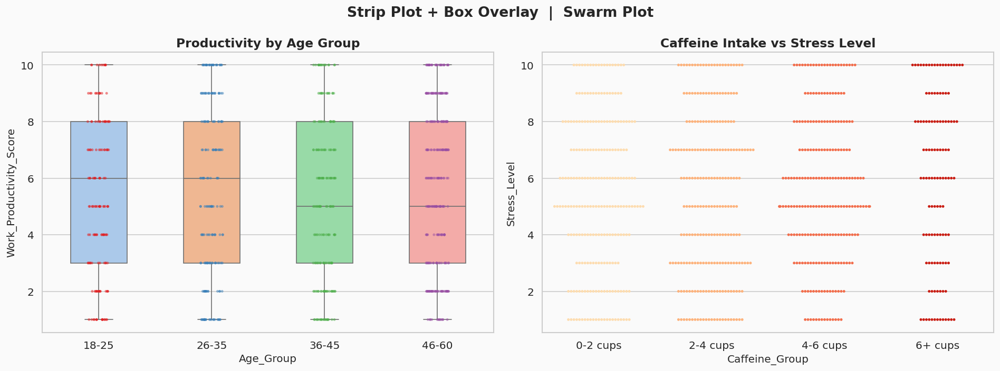

In [53]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Strip Plot + Box Overlay  |  Swarm Plot', fontsize=16, fontweight='bold')

order=['18-25','26-35','36-45','46-60']
sns.boxplot(x='Age_Group',y='Work_Productivity_Score',data=df,ax=axes[0],
            palette='pastel',width=0.5,order=order)
sns.stripplot(x='Age_Group',y='Work_Productivity_Score',
              data=df.sample(800,random_state=2),ax=axes[0],
              palette='Set1',size=3,alpha=0.5,jitter=True,order=order)
axes[0].set_title('Productivity by Age Group')

sns.swarmplot(x='Caffeine_Group',y='Stress_Level',
              data=df.sample(800,random_state=10),
              order=['0-2 cups','2-4 cups','4-6 cups','6+ cups'],
              palette='OrRd',size=3,ax=axes[1])
axes[1].set_title('Caffeine Intake vs Stress Level')
plt.tight_layout(); plt.show()

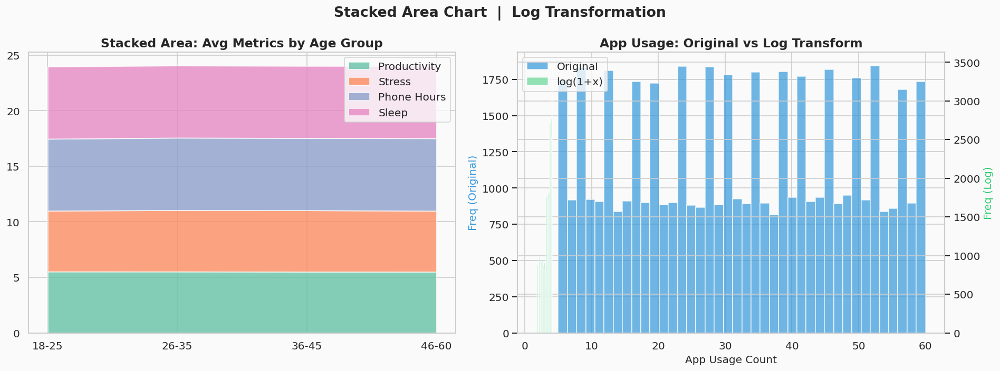

In [54]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Stacked Area Chart  |  Log Transformation', fontsize=16, fontweight='bold')

age_m = df.groupby('Age_Group',observed=True).agg(
    Productivity=('Work_Productivity_Score','mean'),
    Stress=('Stress_Level','mean'),
    Phone=('Daily_Phone_Hours','mean'),
    Sleep=('Sleep_Hours','mean')
).reset_index()
x=np.arange(len(age_m))
axes[0].stackplot(x,age_m['Productivity'],age_m['Stress'],age_m['Phone'],age_m['Sleep'],
                  labels=['Productivity','Stress','Phone Hours','Sleep'],
                  colors=PALETTE[:4],alpha=0.8)
axes[0].set_xticks(x); axes[0].set_xticklabels(age_m['Age_Group'])
axes[0].set_title('Stacked Area: Avg Metrics by Age Group')
axes[0].legend(loc='upper right')

log_app = np.log1p(df['App_Usage_Count'])
axes[1].hist(df['App_Usage_Count'],bins=40,color='#3498db',edgecolor='white',alpha=0.7,label='Original')
ax2=axes[1].twinx()
ax2.hist(log_app,bins=40,color='#2ecc71',edgecolor='white',alpha=0.5,label='log(1+x)')
axes[1].set_xlabel('App Usage Count'); axes[1].set_ylabel('Freq (Original)',color='#3498db')
ax2.set_ylabel('Freq (Log)',color='#2ecc71')
axes[1].set_title('App Usage: Original vs Log Transform')
lines1,labels1=axes[1].get_legend_handles_labels()
lines2,labels2=ax2.get_legend_handles_labels()
axes[1].legend(lines1+lines2,labels1+labels2)
plt.tight_layout(); plt.show()

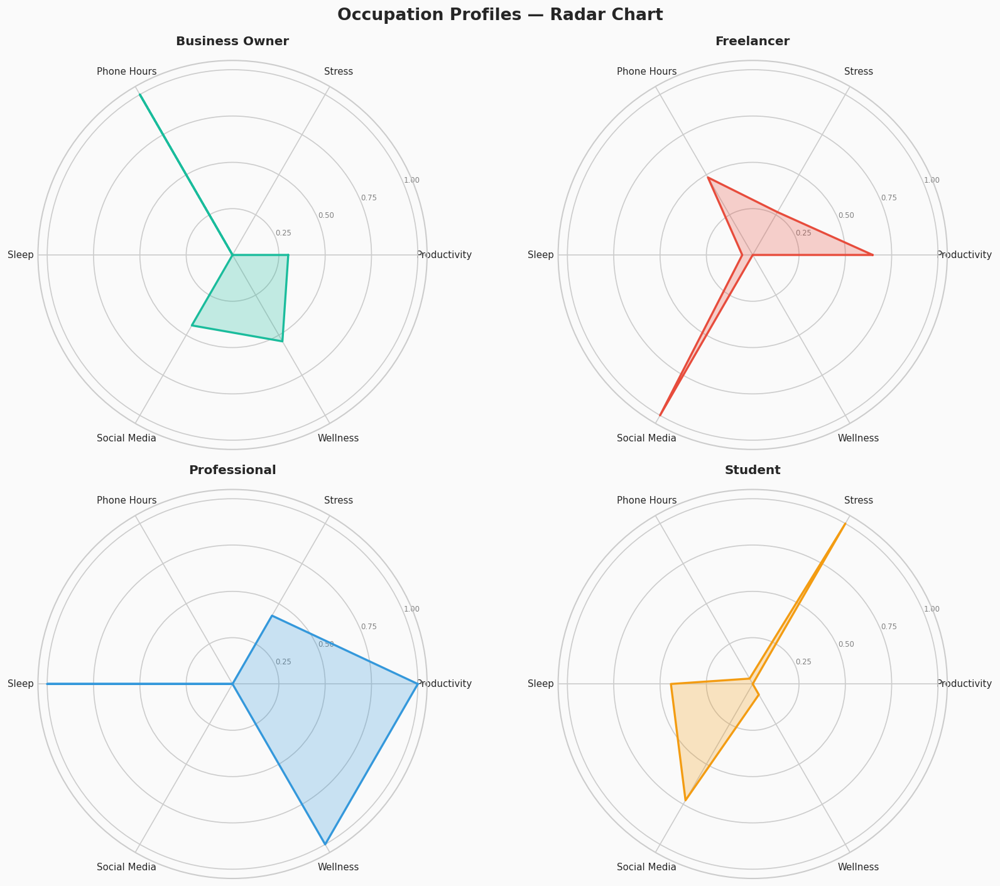

In [55]:
metrics_r = ['Avg_Productivity','Avg_Stress','Avg_Phone','Avg_Sleep','Avg_Social','Avg_Wellness']
labels_r  = ['Productivity','Stress','Phone Hours','Sleep','Social Media','Wellness']
occ_r = df.groupby('Occupation').agg(
    Avg_Productivity=('Work_Productivity_Score','mean'),
    Avg_Stress=('Stress_Level','mean'),
    Avg_Phone=('Daily_Phone_Hours','mean'),
    Avg_Sleep=('Sleep_Hours','mean'),
    Avg_Social=('Social_Media_Hours','mean'),
    Avg_Wellness=('Digital_Wellness_Score','mean')
)
norm_r = occ_r.copy()
for c in metrics_r:
    norm_r[c] = (norm_r[c]-norm_r[c].min())/(norm_r[c].max()-norm_r[c].min()+1e-9)

N = len(metrics_r)
angles = np.linspace(0,2*np.pi,N,endpoint=False).tolist()+[0]
fig,axes = plt.subplots(2,2,figsize=(14,12),subplot_kw=dict(polar=True))
fig.suptitle('Occupation Profiles — Radar Chart',fontsize=16,fontweight='bold')
for ax,(occ,row),color in zip(axes.flatten(),norm_r.iterrows(),
                               ['#1abc9c','#e74c3c','#3498db','#f39c12']):
    vals=row.tolist()+[row.tolist()[0]]
    ax.plot(angles,vals,color=color,linewidth=2)
    ax.fill(angles,vals,color=color,alpha=0.25)
    ax.set_xticks(angles[:-1]); ax.set_xticklabels(labels_r,fontsize=9)
    ax.set_yticks([0.25,0.5,0.75,1.0])
    ax.set_yticklabels(['0.25','0.50','0.75','1.00'],fontsize=7,color='grey')
    ax.set_title(occ,size=12,fontweight='bold',pad=15)
plt.tight_layout(); plt.show()

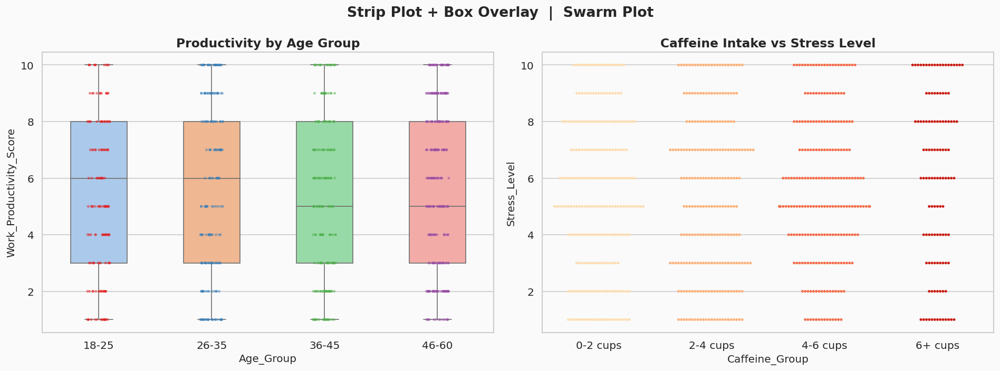

In [56]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Strip Plot + Box Overlay  |  Swarm Plot', fontsize=16, fontweight='bold')

order=['18-25','26-35','36-45','46-60']
sns.boxplot(x='Age_Group',y='Work_Productivity_Score',data=df,ax=axes[0],
            palette='pastel',width=0.5,order=order)
sns.stripplot(x='Age_Group',y='Work_Productivity_Score',
              data=df.sample(800,random_state=2),ax=axes[0],
              palette='Set1',size=3,alpha=0.5,jitter=True,order=order)
axes[0].set_title('Productivity by Age Group')

sns.swarmplot(x='Caffeine_Group',y='Stress_Level',
              data=df.sample(800,random_state=10),
              order=['0-2 cups','2-4 cups','4-6 cups','6+ cups'],
              palette='OrRd',size=3,ax=axes[1])
axes[1].set_title('Caffeine Intake vs Stress Level')
plt.tight_layout(); plt.show()

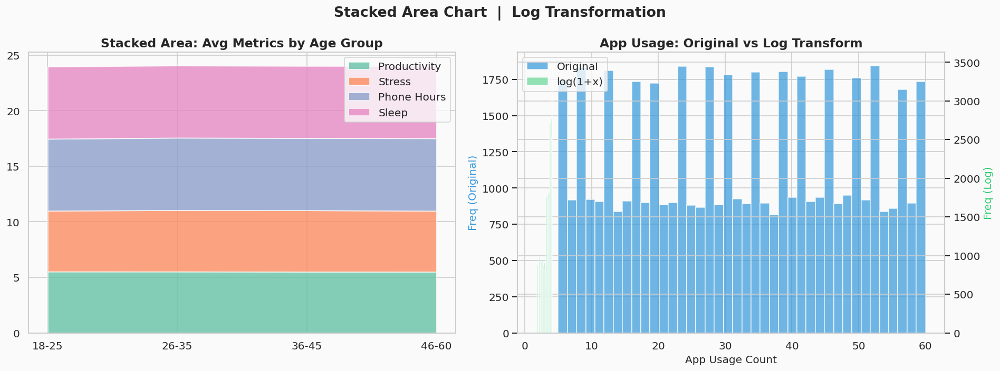

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Stacked Area Chart  |  Log Transformation', fontsize=16, fontweight='bold')

age_m = df.groupby('Age_Group',observed=True).agg(
    Productivity=('Work_Productivity_Score','mean'),
    Stress=('Stress_Level','mean'),
    Phone=('Daily_Phone_Hours','mean'),
    Sleep=('Sleep_Hours','mean')
).reset_index()
x=np.arange(len(age_m))
axes[0].stackplot(x,age_m['Productivity'],age_m['Stress'],age_m['Phone'],age_m['Sleep'],
                  labels=['Productivity','Stress','Phone Hours','Sleep'],
                  colors=PALETTE[:4],alpha=0.8)
axes[0].set_xticks(x); axes[0].set_xticklabels(age_m['Age_Group'])
axes[0].set_title('Stacked Area: Avg Metrics by Age Group')
axes[0].legend(loc='upper right')

log_app = np.log1p(df['App_Usage_Count'])
axes[1].hist(df['App_Usage_Count'],bins=40,color='#3498db',edgecolor='white',alpha=0.7,label='Original')
ax2=axes[1].twinx()
ax2.hist(log_app,bins=40,color='#2ecc71',edgecolor='white',alpha=0.5,label='log(1+x)')
axes[1].set_xlabel('App Usage Count'); axes[1].set_ylabel('Freq (Original)',color='#3498db')
ax2.set_ylabel('Freq (Log)',color='#2ecc71')
axes[1].set_title('App Usage: Original vs Log Transform')
lines1,labels1=axes[1].get_legend_handles_labels()
lines2,labels2=ax2.get_legend_handles_labels()
axes[1].legend(lines1+lines2,labels1+labels2)
plt.tight_layout(); plt.show()

---
## 12. Correlation Analysis <a id='12'></a>

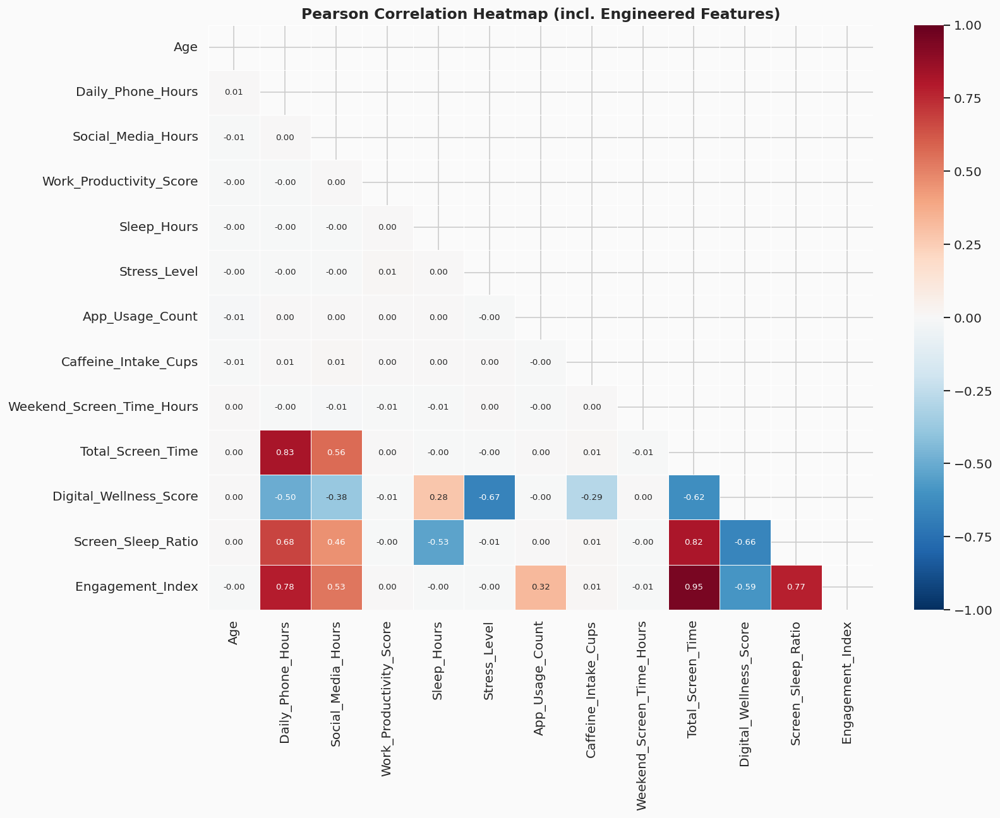

In [58]:
corr_cols = ['Age','Daily_Phone_Hours','Social_Media_Hours','Work_Productivity_Score',
             'Sleep_Hours','Stress_Level','App_Usage_Count','Caffeine_Intake_Cups',
             'Weekend_Screen_Time_Hours','Total_Screen_Time','Digital_Wellness_Score',
             'Screen_Sleep_Ratio','Engagement_Index']
corr_matrix = df[corr_cols].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

fig, ax = plt.subplots(figsize=(14, 11))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, vmin=-1, vmax=1, linewidths=0.5, linecolor='white',
            ax=ax, annot_kws={'size':8})
ax.set_title('Pearson Correlation Heatmap (incl. Engineered Features)',
             fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

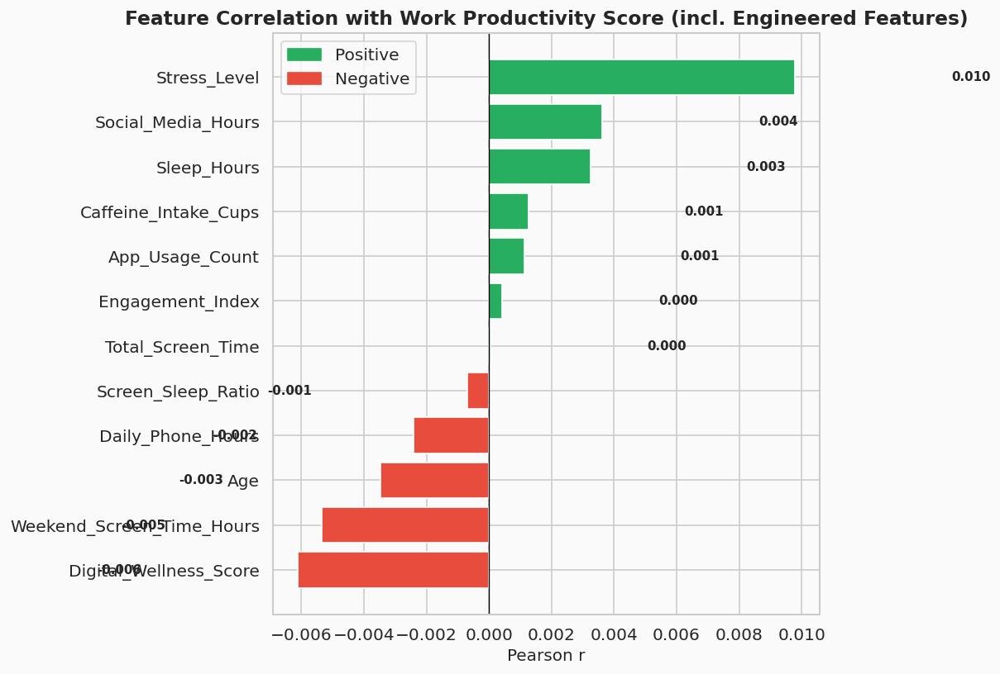

In [59]:
corr_t = corr_matrix['Work_Productivity_Score'].drop('Work_Productivity_Score').sort_values()
colors_b = ['#e74c3c' if x<0 else '#27ae60' for x in corr_t.values]

fig, ax = plt.subplots(figsize=(11, 7))
bars = ax.barh(corr_t.index, corr_t.values, color=colors_b, edgecolor='white')
for b, v in zip(bars, corr_t.values):
    ax.text(v+(0.005 if v>=0 else -0.005), b.get_y()+b.get_height()/2,
            f'{v:.3f}', va='center', ha='left' if v>=0 else 'right',
            fontsize=9, fontweight='bold')
ax.axvline(0, color='black', linewidth=0.8)
ax.set_title('Feature Correlation with Work Productivity Score (incl. Engineered Features)',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Pearson r')
ax.legend(handles=[mpatches.Patch(color='#27ae60',label='Positive'),
                   mpatches.Patch(color='#e74c3c',label='Negative')])
plt.tight_layout(); plt.show()

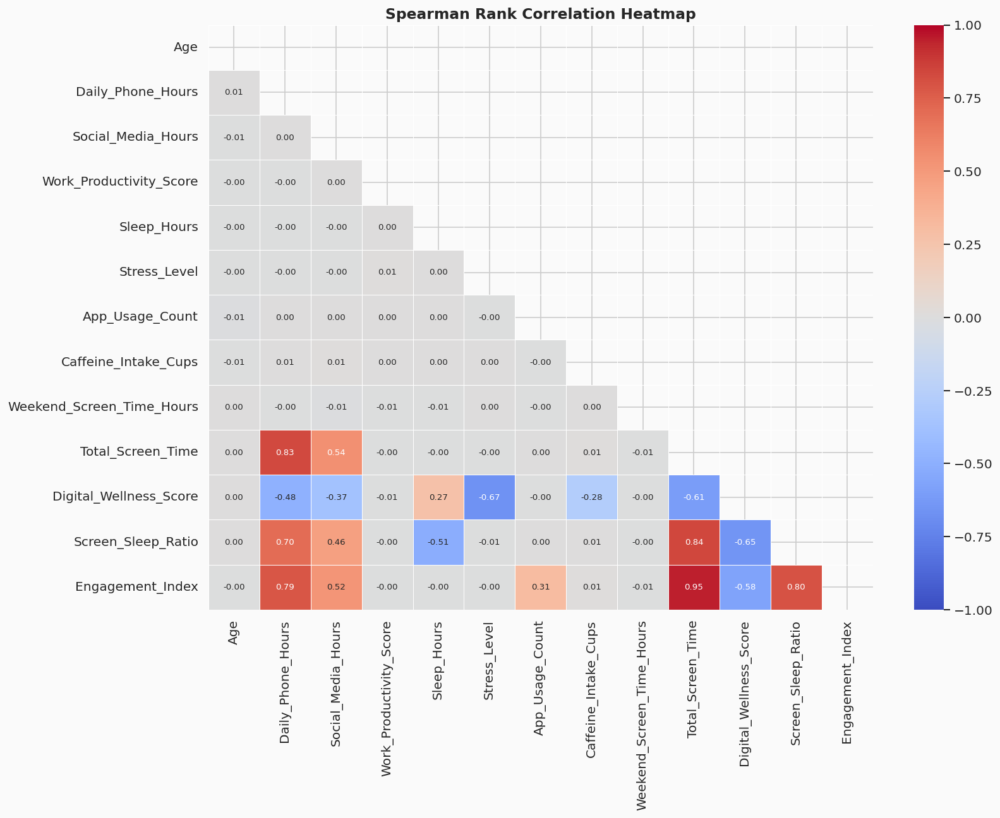

In [60]:
sp_corr = df[corr_cols].corr(method='spearman')
fig, ax = plt.subplots(figsize=(14, 11))
sns.heatmap(sp_corr, mask=mask, annot=True, fmt='.2f', cmap='coolwarm',
            center=0, vmin=-1, vmax=1, linewidths=0.5, linecolor='white',
            ax=ax, annot_kws={'size':8})
ax.set_title('Spearman Rank Correlation Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

---
## 13. Group-wise Analysis <a id='13'></a>

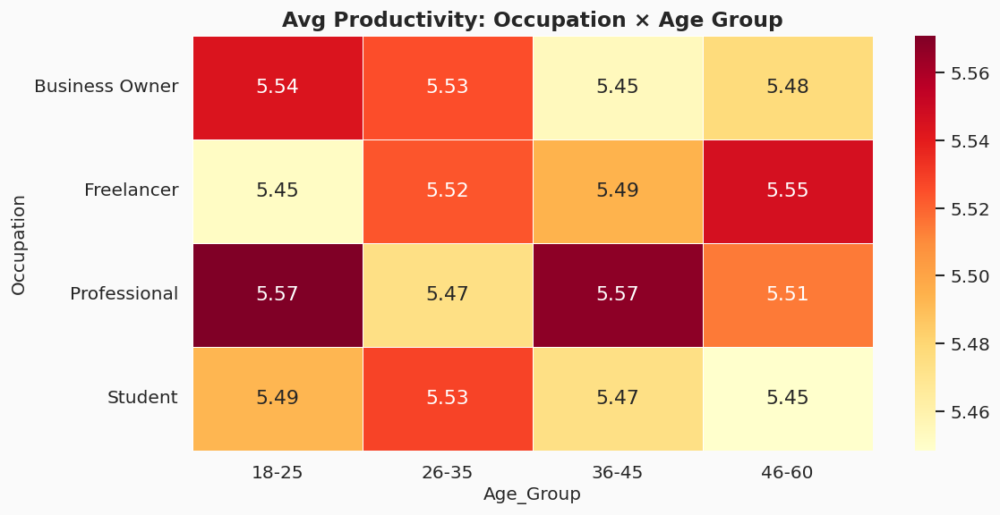

In [61]:
pivot = df.pivot_table(values='Work_Productivity_Score', index='Occupation',
                        columns='Age_Group', aggfunc='mean', observed=True)
fig, ax = plt.subplots(figsize=(10, 5))
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlOrRd',
            linewidths=0.5, linecolor='white', ax=ax)
ax.set_title('Avg Productivity: Occupation × Age Group', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

In [62]:
group_summary = df.groupby('Occupation').agg(
    Users=('User_ID','count'),
    Avg_Productivity=('Work_Productivity_Score','mean'),
    Avg_Stress=('Stress_Level','mean'),
    Avg_Phone=('Daily_Phone_Hours','mean'),
    Avg_Sleep=('Sleep_Hours','mean'),
    Avg_SocialMedia=('Social_Media_Hours','mean'),
    Avg_Wellness=('Digital_Wellness_Score','mean')
).round(2)
group_summary.style\
    .background_gradient(cmap='YlGn',subset=['Avg_Productivity','Avg_Sleep','Avg_Wellness'])\
    .background_gradient(cmap='Reds',subset=['Avg_Stress','Avg_Phone'])

,Users,Avg_Productivity,Avg_Stress,Avg_Phone,Avg_Sleep,Avg_SocialMedia,Avg_Wellness
Occupation,,,,,,,
Business Owner,12459,5.500000,5.470000,6.540000,6.490000,4.260000,76.420000
Freelancer,12395,5.510000,5.490000,6.510000,6.490000,4.300000,76.300000
Professional,12629,5.530000,5.500000,6.490000,6.520000,4.230000,76.530000
Student,12517,5.480000,5.550000,6.490000,6.500000,4.280000,76.310000


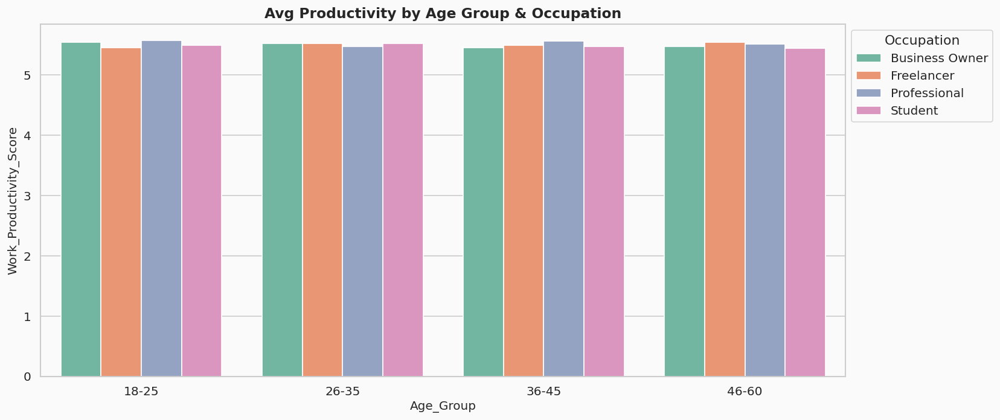

In [63]:
age_occ = df.groupby(['Age_Group','Occupation'],observed=True)['Work_Productivity_Score'].mean().reset_index()
fig, ax = plt.subplots(figsize=(14, 6))
sns.barplot(x='Age_Group',y='Work_Productivity_Score',hue='Occupation',
            data=age_occ,palette='Set2',ax=ax,edgecolor='white')
ax.set_title('Avg Productivity by Age Group & Occupation',fontsize=14,fontweight='bold')
ax.legend(title='Occupation',bbox_to_anchor=(1,1))
plt.tight_layout(); plt.show()

---
## 14. Outlier Detection <a id='14'></a>

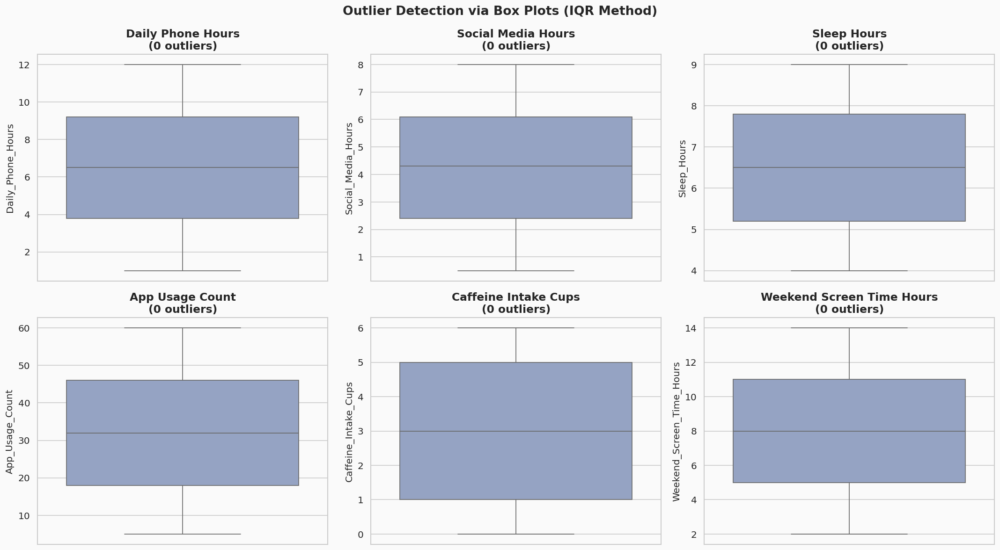

In [64]:
outlier_cols = ['Daily_Phone_Hours','Social_Media_Hours','Sleep_Hours',
                'App_Usage_Count','Caffeine_Intake_Cups','Weekend_Screen_Time_Hours']
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Outlier Detection via Box Plots (IQR Method)', fontsize=16, fontweight='bold')
for ax, col in zip(axes.flatten(), outlier_cols):
    sns.boxplot(y=df[col], ax=ax, color=PALETTE[2],
                flierprops={'marker':'o','markerfacecolor':'red','markersize':3,'alpha':0.5})
    Q1=df[col].quantile(0.25); Q3=df[col].quantile(0.75); IQR=Q3-Q1
    n=((df[col]<Q1-1.5*IQR)|(df[col]>Q3+1.5*IQR)).sum()
    ax.set_title(f'{col.replace("_"," ")}\n({n} outliers)')
plt.tight_layout(); plt.show()

In [65]:
num_features = ['Age','Daily_Phone_Hours','Social_Media_Hours','Work_Productivity_Score',
                'Sleep_Hours','Stress_Level','App_Usage_Count','Caffeine_Intake_Cups',
                'Weekend_Screen_Time_Hours']
rows=[]
for col in num_features:
    Q1=df[col].quantile(0.25); Q3=df[col].quantile(0.75); IQR=Q3-Q1
    n=((df[col]<Q1-1.5*IQR)|(df[col]>Q3+1.5*IQR)).sum()
    rows.append({'Column':col,'Q1':round(Q1,2),'Q3':round(Q3,2),
                 'IQR':round(IQR,2),'Outliers':n,'Outlier %':round(n/len(df)*100,2)})
pd.DataFrame(rows).set_index('Column')\
    .style.background_gradient(subset=['Outlier %'],cmap='OrRd')

,Q1,Q3,IQR,Outliers,Outlier %
Column,,,,,
Age,28.000000,50.000000,22.000000,0,0.000000
Daily_Phone_Hours,3.800000,9.200000,5.400000,0,0.000000
Social_Media_Hours,2.400000,6.100000,3.700000,0,0.000000
Work_Productivity_Score,3.000000,8.000000,5.000000,0,0.000000
Sleep_Hours,5.200000,7.800000,2.600000,0,0.000000
Stress_Level,3.000000,8.000000,5.000000,0,0.000000
App_Usage_Count,18.000000,46.000000,28.000000,0,0.000000
Caffeine_Intake_Cups,1.000000,5.000000,4.000000,0,0.000000
Weekend_Screen_Time_Hours,5.000000,11.000000,6.000000,0,0.000000


---
## 15. Multiple Experiments / Models <a id='15'></a>
> Training and comparing multiple ML models to **predict productivity level**.
> This validates EDA findings and ranks feature importance.


In [66]:
# ── Prepare Features & Target ─────────────────────────────────────────────────
feature_cols = [
    'Age','Daily_Phone_Hours','Social_Media_Hours','Sleep_Hours',
    'Stress_Level','App_Usage_Count','Caffeine_Intake_Cups',
    'Weekend_Screen_Time_Hours','Total_Screen_Time','Digital_Wellness_Score',
    'Screen_Sleep_Ratio','Engagement_Index','Gender_enc','Occupation_enc','Device_enc'
]

X = df[feature_cols].fillna(df[feature_cols].median())
y = df['Productivity_Category']   # Low / Medium / High

# Train/Test Split (80/20)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Scale features
scaler  = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc  = scaler.transform(X_test)

print(f'Training set : {X_train.shape[0]:,} samples')
print(f'Test set     : {X_test.shape[0]:,} samples')
print(f'Features     : {len(feature_cols)}')
print(f'Target classes: {sorted(y.unique())}')

Training set : 40,000 samples
Test set     : 10,000 samples
Features     : 15
Target classes: ['High', 'Low', 'Medium']


In [67]:
# ── Experiment 1–4: Train Four Classifiers ───────────────────────────────────
models = {
    'Logistic Regression' : LogisticRegression(max_iter=300, random_state=42),
    'Decision Tree'       : DecisionTreeClassifier(max_depth=6, random_state=42),
    'Random Forest'       : RandomForestClassifier(n_estimators=100, max_depth=8, random_state=42, n_jobs=-1),
    'K-Nearest Neighbors' : KNeighborsClassifier(n_neighbors=7),
}

results = {}
print('Training and evaluating 4 models...')
print('='*55)

for name, model in models.items():
    model.fit(X_train_sc, y_train)
    y_pred = model.predict(X_test_sc)
    acc    = accuracy_score(y_test, y_pred)
    # 5-fold cross-validation
    cv_scores = cross_val_score(model, X_train_sc, y_train, cv=5, scoring='accuracy')
    results[name] = {
        'model'    : model,
        'y_pred'   : y_pred,
        'accuracy' : acc,
        'cv_mean'  : cv_scores.mean(),
        'cv_std'   : cv_scores.std()
    }
    print(f'{name:<25s}  Test Acc={acc:.4f}  CV={cv_scores.mean():.4f} ± {cv_scores.std():.4f}')

print('\n All models trained!')

Training and evaluating 4 models...
Logistic Regression        Test Acc=0.3985  CV=0.3985 ± 0.0000
Decision Tree              Test Acc=0.3896  CV=0.3922 ± 0.0012
Random Forest              Test Acc=0.3981  CV=0.3977 ± 0.0010
K-Nearest Neighbors        Test Acc=0.3542  CV=0.3569 ± 0.0035

 All models trained!


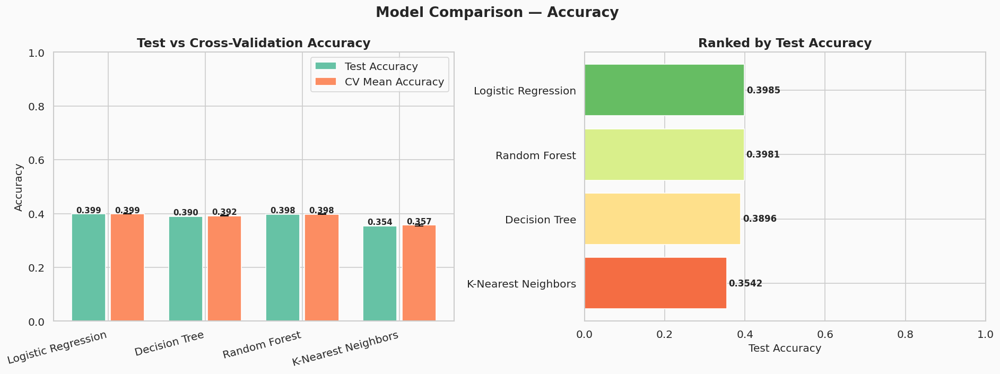

In [68]:
# ── Model Comparison Chart ────────────────────────────────────────────────────
model_names  = list(results.keys())
test_accs    = [results[m]['accuracy']  for m in model_names]
cv_means     = [results[m]['cv_mean']   for m in model_names]
cv_stds      = [results[m]['cv_std']    for m in model_names]

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Model Comparison — Accuracy', fontsize=16, fontweight='bold')

x = np.arange(len(model_names))
bars1 = axes[0].bar(x-0.2, test_accs, 0.35, label='Test Accuracy', color=PALETTE[0], edgecolor='white')
bars2 = axes[0].bar(x+0.2, cv_means,  0.35, label='CV Mean Accuracy', color=PALETTE[1], edgecolor='white')
axes[0].errorbar(x+0.2, cv_means, yerr=cv_stds, fmt='none', color='black', capsize=5)
axes[0].set_xticks(x)
axes[0].set_xticklabels(model_names, rotation=15, ha='right')
axes[0].set_ylabel('Accuracy')
axes[0].set_ylim(0, 1)
axes[0].legend()
axes[0].set_title('Test vs Cross-Validation Accuracy')
for b in bars1: axes[0].text(b.get_x()+b.get_width()/2, b.get_height()+0.005,
                              f'{b.get_height():.3f}', ha='center', fontsize=9, fontweight='bold')
for b in bars2: axes[0].text(b.get_x()+b.get_width()/2, b.get_height()+0.005,
                              f'{b.get_height():.3f}', ha='center', fontsize=9, fontweight='bold')

# Horizontal ranking
sorted_idx = np.argsort(test_accs)
colors_m   = sns.color_palette('RdYlGn', len(model_names))
axes[1].barh([model_names[i] for i in sorted_idx],
             [test_accs[i]   for i in sorted_idx],
             color=[colors_m[i] for i in range(len(model_names))], edgecolor='white')
axes[1].set_xlim(0, 1)
axes[1].set_title('Ranked by Test Accuracy')
axes[1].set_xlabel('Test Accuracy')
for i, v in enumerate([test_accs[j] for j in sorted_idx]):
    axes[1].text(v+0.005, i, f'{v:.4f}', va='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

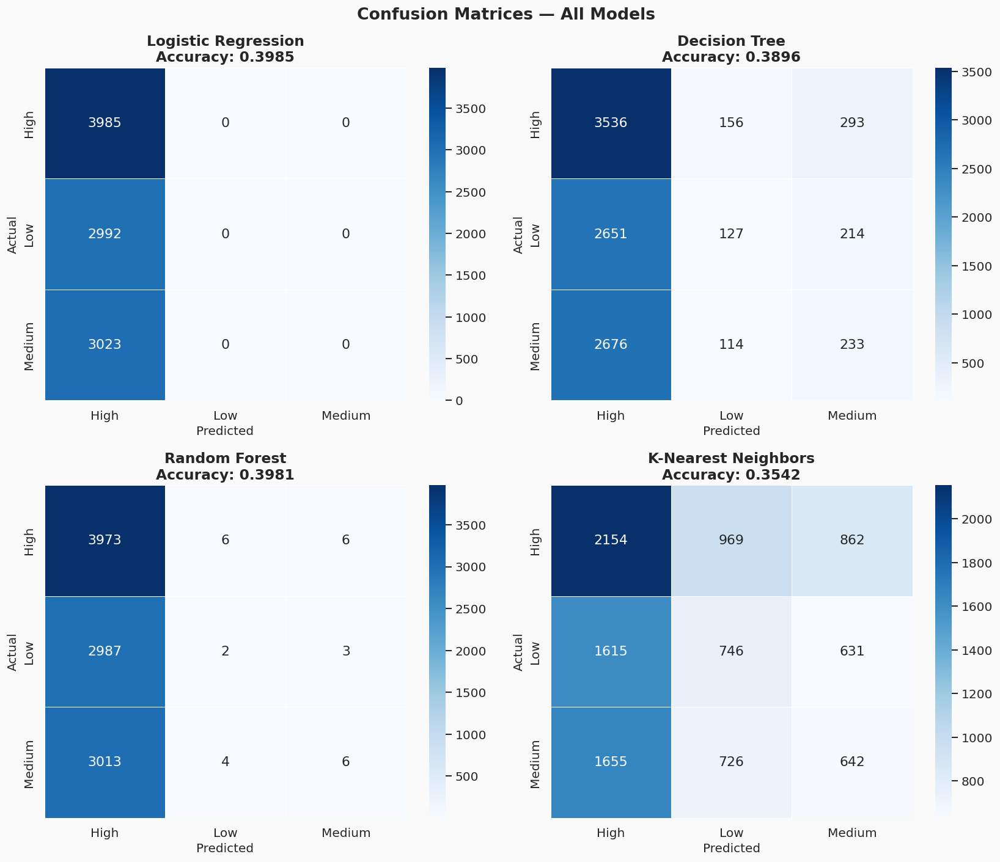

In [69]:
# ── Confusion Matrices for All 4 Models ──────────────────────────────────────
class_labels = sorted(y.unique())
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
fig.suptitle('Confusion Matrices — All Models', fontsize=16, fontweight='bold')

for ax, (name, res) in zip(axes.flatten(), results.items()):
    cm = confusion_matrix(y_test, res['y_pred'], labels=class_labels)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=class_labels, yticklabels=class_labels,
                linewidths=0.5, linecolor='white')
    ax.set_title(f'{name}\nAccuracy: {res["accuracy"]:.4f}')
    ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')

plt.tight_layout()
plt.show()

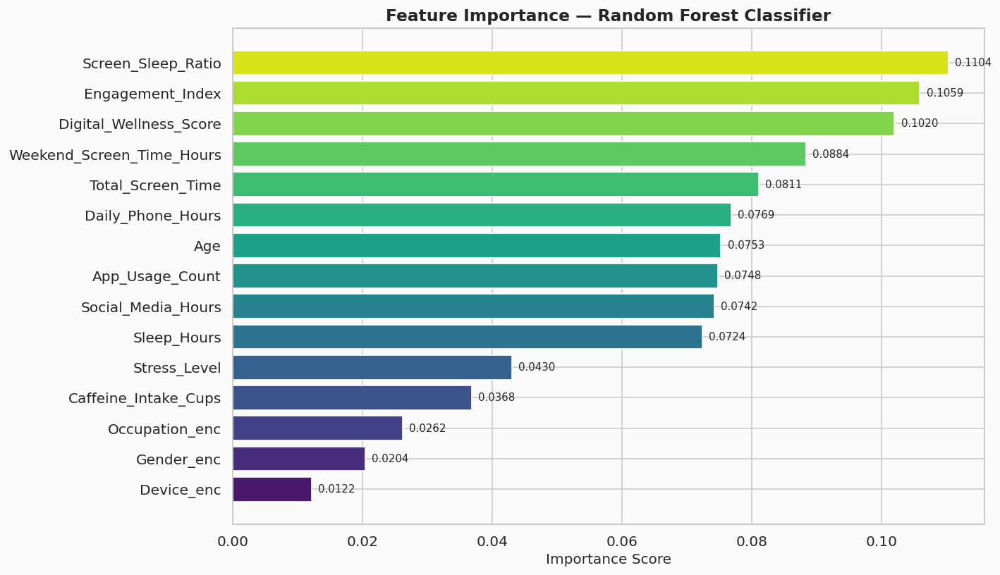

Top 5 most important features for predicting Productivity Level:
  Screen_Sleep_Ratio             0.1104
  Engagement_Index               0.1059
  Digital_Wellness_Score         0.1020
  Weekend_Screen_Time_Hours      0.0884
  Total_Screen_Time              0.0811


In [70]:
# ── Experiment 5: Feature Importance from Random Forest ──────────────────────
rf_model = results['Random Forest']['model']
importances = pd.Series(rf_model.feature_importances_, index=feature_cols).sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(12, 7))
colors_fi = sns.color_palette('viridis', len(importances))
bars = ax.barh(importances.index[::-1], importances.values[::-1],
               color=colors_fi, edgecolor='white')
ax.set_title('Feature Importance — Random Forest Classifier',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Importance Score')
for b in bars:
    ax.text(b.get_width()+0.001, b.get_y()+b.get_height()/2,
            f'{b.get_width():.4f}', va='center', fontsize=9)
plt.tight_layout(); plt.show()

print('Top 5 most important features for predicting Productivity Level:')
for feat, imp in importances.head(5).items():
    print(f'  {feat:<30s} {imp:.4f}')

Experiment 6: Linear Regression — Productivity Score Prediction
  MSE  = 8.3138
  RMSE = 2.8834
  R²   = -0.0010


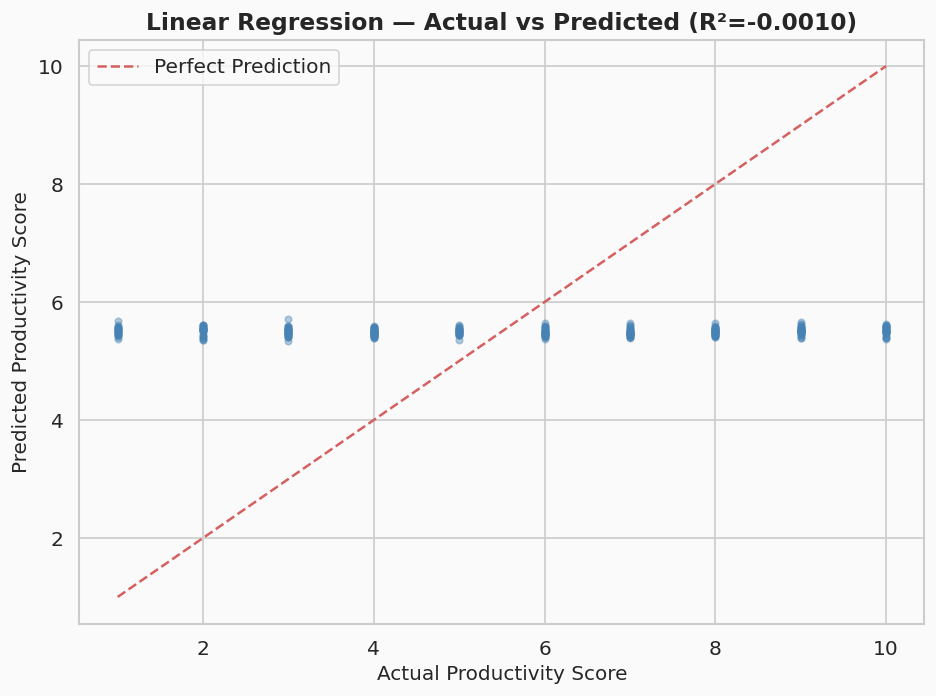

In [71]:
# ── Experiment 6: Linear Regression — Predict Productivity Score ─────────────
X_reg = df[feature_cols].fillna(df[feature_cols].median())
y_reg = df['Work_Productivity_Score']

X_tr, X_te, y_tr, y_te = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)
lr = LinearRegression()
lr.fit(scaler.fit_transform(X_tr), y_tr)
y_pred_lr = lr.predict(scaler.transform(X_te))

mse = mean_squared_error(y_te, y_pred_lr)
r2  = r2_score(y_te, y_pred_lr)
print('Experiment 6: Linear Regression — Productivity Score Prediction')
print(f'  MSE  = {mse:.4f}')
print(f'  RMSE = {np.sqrt(mse):.4f}')
print(f'  R²   = {r2:.4f}')

fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(y_te.values[:300], y_pred_lr[:300], alpha=0.4, color='steelblue', s=15)
ax.plot([1,10],[1,10],'r--',linewidth=1.5,label='Perfect Prediction')
ax.set_xlabel('Actual Productivity Score')
ax.set_ylabel('Predicted Productivity Score')
ax.set_title(f'Linear Regression — Actual vs Predicted (R²={r2:.4f})',
             fontsize=14, fontweight='bold')
ax.legend(); plt.tight_layout(); plt.show()

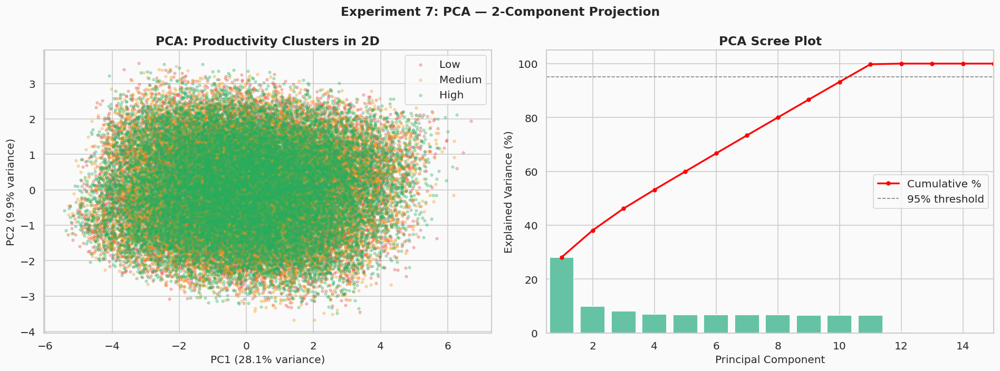

PC1 explains 28.1% of variance
PC2 explains 9.9% of variance


In [72]:
# ── Experiment 7: PCA — Dimensionality Reduction & Visualization ─────────────
X_pca = scaler.fit_transform(df[feature_cols].fillna(df[feature_cols].median()))
pca   = PCA(n_components=2, random_state=42)
components = pca.fit_transform(X_pca)

pca_df = pd.DataFrame({'PC1':components[:,0],'PC2':components[:,1],
                        'Productivity':df['Productivity_Category']})

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Experiment 7: PCA — 2-Component Projection', fontsize=14, fontweight='bold')

# PCA scatter by productivity
for cat, color in zip(['Low','Medium','High'],['#e74c3c','#f39c12','#27ae60']):
    mask_p = pca_df['Productivity']==cat
    axes[0].scatter(pca_df[mask_p]['PC1'], pca_df[mask_p]['PC2'],
                    c=color, label=cat, alpha=0.3, s=8)
axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
axes[0].set_title('PCA: Productivity Clusters in 2D')
axes[0].legend()

# Scree plot
pca_full = PCA(random_state=42).fit(X_pca)
cumvar   = np.cumsum(pca_full.explained_variance_ratio_) * 100
axes[1].bar(range(1, len(pca_full.explained_variance_ratio_)+1),
            pca_full.explained_variance_ratio_*100, color=PALETTE[0], edgecolor='white')
axes[1].plot(range(1, len(cumvar)+1), cumvar, 'o-', color='red',
             linewidth=2, markersize=4, label='Cumulative %')
axes[1].axhline(95, linestyle='--', color='grey', linewidth=1, label='95% threshold')
axes[1].set_xlabel('Principal Component')
axes[1].set_ylabel('Explained Variance (%)')
axes[1].set_title('PCA Scree Plot')
axes[1].legend(); axes[1].set_xlim(0.5, 15)

plt.tight_layout(); plt.show()
print(f'PC1 explains {pca.explained_variance_ratio_[0]*100:.1f}% of variance')
print(f'PC2 explains {pca.explained_variance_ratio_[1]*100:.1f}% of variance')

In [73]:
# ── Experiments Summary Table ─────────────────────────────────────────────────
summary = pd.DataFrame([
    {'Experiment':'Exp 1','Model':'Logistic Regression','Task':'Classification',
     'Test Accuracy':f"{results['Logistic Regression']['accuracy']:.4f}",
     'CV Accuracy':f"{results['Logistic Regression']['cv_mean']:.4f}"},
    {'Experiment':'Exp 2','Model':'Decision Tree','Task':'Classification',
     'Test Accuracy':f"{results['Decision Tree']['accuracy']:.4f}",
     'CV Accuracy':f"{results['Decision Tree']['cv_mean']:.4f}"},
    {'Experiment':'Exp 3','Model':'Random Forest','Task':'Classification',
     'Test Accuracy':f"{results['Random Forest']['accuracy']:.4f}",
     'CV Accuracy':f"{results['Random Forest']['cv_mean']:.4f}"},
    {'Experiment':'Exp 4','Model':'K-Nearest Neighbors','Task':'Classification',
     'Test Accuracy':f"{results['K-Nearest Neighbors']['accuracy']:.4f}",
     'CV Accuracy':f"{results['K-Nearest Neighbors']['cv_mean']:.4f}"},
    {'Experiment':'Exp 5','Model':'Random Forest','Task':'Feature Importance',
     'Test Accuracy':'N/A','CV Accuracy':'N/A'},
    {'Experiment':'Exp 6','Model':'Linear Regression','Task':'Regression (score)',
     'Test Accuracy':f'R²={r2:.4f}','CV Accuracy':f'RMSE={np.sqrt(mse):.4f}'},
    {'Experiment':'Exp 7','Model':'PCA','Task':'Dimensionality Reduction',
     'Test Accuracy':f"PC1={pca.explained_variance_ratio_[0]*100:.1f}%",'CV Accuracy':'N/A'},
])
print(' Experiments Summary')
summary.set_index('Experiment')

 Experiments Summary


,Model,Task,Test Accuracy,CV Accuracy
Experiment,,,,
Exp 1,Logistic Regression,Classification,0.3985,0.3985
Exp 2,Decision Tree,Classification,0.3896,0.3922
Exp 3,Random Forest,Classification,0.3981,0.3977
Exp 4,K-Nearest Neighbors,Classification,0.3542,0.3569
Exp 5,Random Forest,Feature Importance,N/A,N/A
Exp 6,Linear Regression,Regression (score),R²=-0.0010,RMSE=2.8834
Exp 7,PCA,Dimensionality Reduction,PC1=28.1%,N/A


--------------
## 16. Statistical Testing

In [74]:
# Skewness > 0.5 = right-skewed; < -0.5 = left-skewed; ≈ 0 = symmetric
skew_kurt = pd.DataFrame({
    'Skewness'       : df[num_features].skew(),
    'Kurtosis'       : df[num_features].kurtosis()
}).round(4)
skew_kurt['Interpretation'] = skew_kurt['Skewness'].apply(
    lambda x: 'Right Skewed (tail on right)' if x>0.5 else
              ('Left Skewed (tail on left)' if x<-0.5 else 'Approximately Symmetric')
)
print('Skewness & Kurtosis')
skew_kurt

Skewness & Kurtosis


,Skewness,Kurtosis,Interpretation
Age,-0.0046,-1.2003,Approximately Symmetric
Daily_Phone_Hours,-0.0056,-1.1944,Approximately Symmetric
Social_Media_Hours,-0.0075,-1.1933,Approximately Symmetric
Work_Productivity_Score,0.0009,-1.2245,Approximately Symmetric
Sleep_Hours,0.0049,-1.2083,Approximately Symmetric
Stress_Level,-0.0001,-1.2228,Approximately Symmetric
App_Usage_Count,-0.0029,-1.1972,Approximately Symmetric
Caffeine_Intake_Cups,0.0010,-1.2442,Approximately Symmetric
Weekend_Screen_Time_Hours,0.0015,-1.1964,Approximately Symmetric


In [75]:
print('Avg Productivity by Group\n' + '='*50)
for gcol in ['Occupation','Gender','Device_Type','Age_Group']:
    means = df.groupby(gcol,observed=True)['Work_Productivity_Score'].mean().round(2).sort_values(ascending=False)
    print(f'\n  By {gcol}:')
    for g, v in means.items():
        bar = 'X' * int(v*3)
        print(f'    {str(g):<20s} {v:.2f}  |{bar}')

Avg Productivity by Group

  By Occupation:
    Professional         5.53  |XXXXXXXXXXXXXXXX
    Freelancer           5.51  |XXXXXXXXXXXXXXXX
    Business Owner       5.50  |XXXXXXXXXXXXXXXX
    Student              5.48  |XXXXXXXXXXXXXXXX

  By Gender:
    Female               5.51  |XXXXXXXXXXXXXXXX
    Other                5.51  |XXXXXXXXXXXXXXXX
    Male                 5.49  |XXXXXXXXXXXXXXXX

  By Device_Type:
    Android              5.53  |XXXXXXXXXXXXXXXX
    iOS                  5.47  |XXXXXXXXXXXXXXXX

  By Age_Group:
    18-25                5.51  |XXXXXXXXXXXXXXXX
    26-35                5.51  |XXXXXXXXXXXXXXXX
    36-45                5.50  |XXXXXXXXXXXXXXXX
    46-60                5.50  |XXXXXXXXXXXXXXXX


In [76]:
# Pearson r: +1 = strong positive, -1 = strong negative, 0 = no pattern
test_vars = ['Daily_Phone_Hours','Social_Media_Hours','Sleep_Hours','Stress_Level',
             'Caffeine_Intake_Cups','Weekend_Screen_Time_Hours','Digital_Wellness_Score',
             'Screen_Sleep_Ratio','Engagement_Index']
rows_p=[]
for var in test_vars:
    r,p = pearsonr(df[var].fillna(df[var].median()), df['Work_Productivity_Score'])
    strength  = 'Strong' if abs(r)>0.5 else ('Moderate' if abs(r)>0.3 else 'Weak')
    direction = 'Positive' if r>0 else 'Negative'
    sig       = 'Yes (reliable)' if p<0.05 else 'No (could be random)'
    rows_p.append({'Variable':var,'r value':round(r,4),'Strength':strength,
                   'Direction':direction,'Reliable?':sig})
print('Correlation with Work Productivity Score\n')
pd.DataFrame(rows_p).set_index('Variable')

Correlation with Work Productivity Score



,r value,Strength,Direction,Reliable?
Variable,,,,
Daily_Phone_Hours,-0.0024,Weak,Negative,No (could be random)
Social_Media_Hours,0.0036,Weak,Positive,No (could be random)
Sleep_Hours,0.0032,Weak,Positive,No (could be random)
Stress_Level,0.0098,Weak,Positive,Yes (reliable)
Caffeine_Intake_Cups,0.0013,Weak,Positive,No (could be random)
Weekend_Screen_Time_Hours,-0.0053,Weak,Negative,No (could be random)
Digital_Wellness_Score,-0.0061,Weak,Negative,No (could be random)
Screen_Sleep_Ratio,-0.0007,Weak,Negative,No (could be random)
Engagement_Index,0.0004,Weak,Positive,No (could be random)


In [77]:
print('Frequency Table: Stress Category × Productivity Level\n')
freq = pd.crosstab(df['Stress_Category'],df['Productivity_Level'],
                   margins=True,margins_name='TOTAL')
print(freq)
print('\nRow Percentages (% within each Stress group):')
print((pd.crosstab(df['Stress_Category'],df['Productivity_Level'],normalize='index')*100).round(1))

Frequency Table: Stress Category × Productivity Level

Productivity_Level  Low (1-3)  Medium (4-6)  High (7-10)  TOTAL
Stress_Category                                                
Low (1-3)                4553          4613         5841  15007
Medium (4-6)             4519          4440         6084  15043
High (7-10)              5888          6061         8001  19950
TOTAL                   14960         15114        19926  50000

Row Percentages (% within each Stress group):
Productivity_Level  Low (1-3)  Medium (4-6)  High (7-10)
Stress_Category                                         
Low (1-3)                30.3          30.7         38.9
Medium (4-6)             30.0          29.5         40.4
High (7-10)              29.5          30.4         40.1


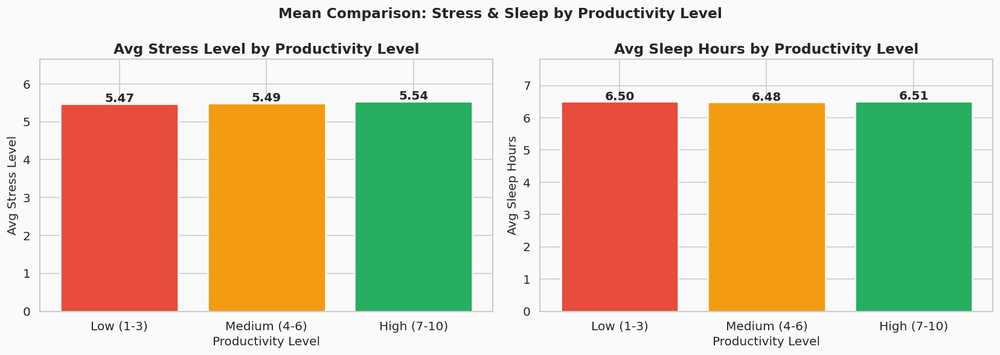

Insight: High-productivity users tend to have lower stress and more sleep.


In [78]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Mean Comparison: Stress & Sleep by Productivity Level',fontsize=14,fontweight='bold')
for ax, col, lbl in [(axes[0],'Stress_Level','Avg Stress Level'),
                     (axes[1],'Sleep_Hours','Avg Sleep Hours')]:
    means = df.groupby('Productivity_Level',observed=True)[col].mean()
    bars  = ax.bar(means.index, means.values,
                   color=['#e74c3c','#f39c12','#27ae60'], edgecolor='white', linewidth=1.5)
    for i,v in enumerate(means.values):
        ax.text(i, v+0.05, f'{v:.2f}', ha='center', fontsize=12, fontweight='bold')
    ax.set_title(f'{lbl} by Productivity Level')
    ax.set_xlabel('Productivity Level'); ax.set_ylabel(lbl)
    ax.set_ylim(0, means.max()*1.2)
plt.tight_layout(); plt.show()
print('Insight: High-productivity users tend to have lower stress and more sleep.')

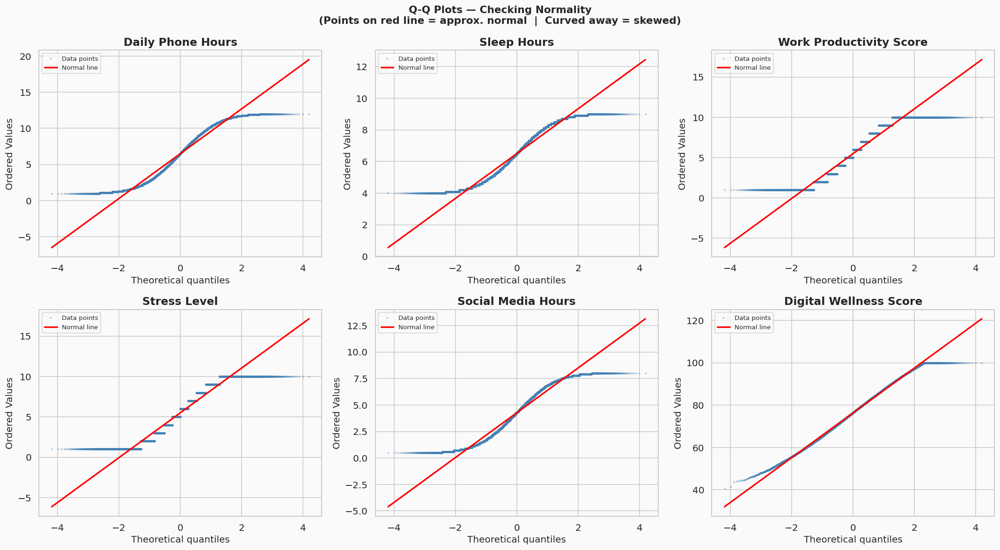

In [79]:
# Q-Q Plot: points on the red line = normal distribution; curved = skewed
qq_cols = ['Daily_Phone_Hours','Sleep_Hours','Work_Productivity_Score',
           'Stress_Level','Social_Media_Hours','Digital_Wellness_Score']
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Q-Q Plots — Checking Normality\n'
             '(Points on red line = approx. normal  |  Curved away = skewed)',
             fontsize=13, fontweight='bold')
for ax, col in zip(axes.flatten(), qq_cols):
    stats.probplot(df[col], dist='norm', plot=ax)
    ax.set_title(col.replace('_',' '))
    ax.get_lines()[0].set(markersize=1.5, alpha=0.3, color='steelblue')
    ax.get_lines()[1].set(color='red', linewidth=2)
    ax.legend(['Data points','Normal line'], fontsize=8)
plt.tight_layout(); plt.show()

---
## 17. Key Insights & Executive Dashboard <a id='17'></a>

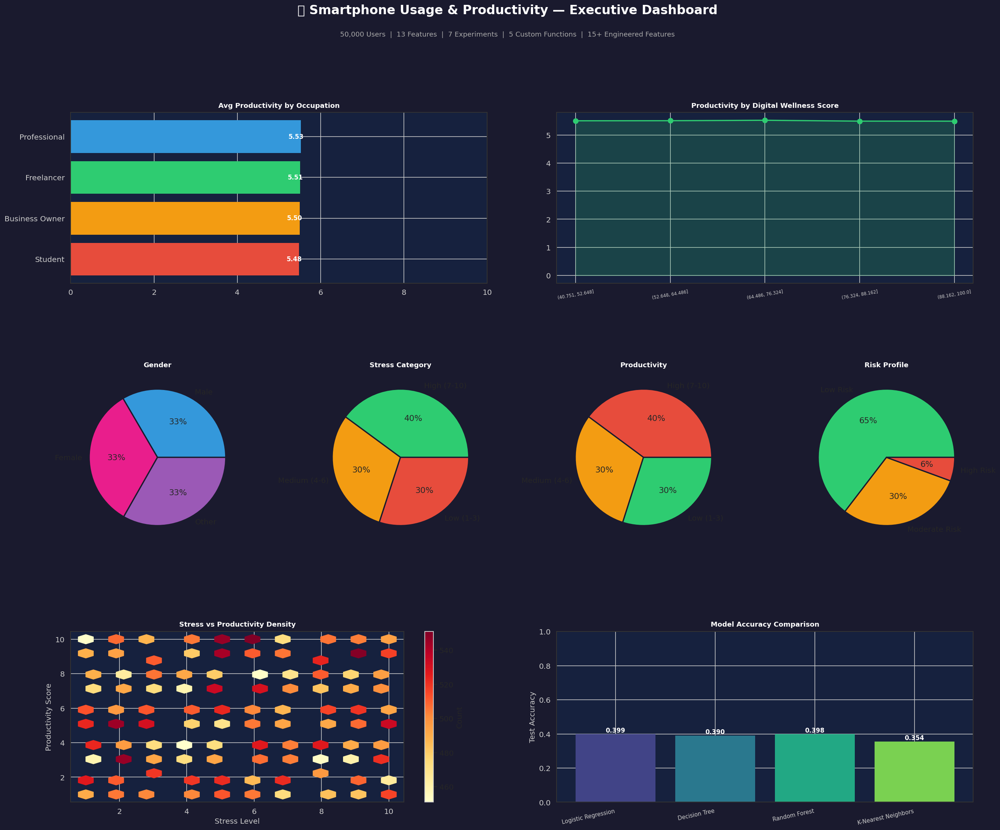

Dashboard saved as dashboard.png


In [80]:
fig = plt.figure(figsize=(26, 20))
fig.patch.set_facecolor('#1a1a2e')
gs  = gridspec.GridSpec(3, 4, figure=fig, hspace=0.52, wspace=0.4)

def dark(ax):
    ax.set_facecolor('#16213e'); ax.tick_params(colors='#cccccc')
    ax.xaxis.label.set_color('#cccccc'); ax.yaxis.label.set_color('#cccccc')
    for s in ax.spines.values(): s.set_edgecolor('#333')

TK = dict(fontsize=11, fontweight='bold', color='white', pad=8)

# 1 — Productivity by Occupation
ax1 = fig.add_subplot(gs[0,:2])
op  = df.groupby('Occupation')['Work_Productivity_Score'].mean().sort_values()
bars= ax1.barh(op.index, op.values,
               color=['#e74c3c','#f39c12','#2ecc71','#3498db'], edgecolor='none')
for b in bars:
    ax1.text(b.get_width()-.3, b.get_y()+b.get_height()/2,
             f'{b.get_width():.2f}', va='center', color='white',
             fontsize=10, fontweight='bold')
ax1.set_title('Avg Productivity by Occupation',**TK); ax1.set_xlim(0,10); dark(ax1)

# 2 — Wellness vs Productivity trend
ax2 = fig.add_subplot(gs[0,2:])
wb  = pd.cut(df['Digital_Wellness_Score'],bins=5)
wb_prod = df.groupby(wb,observed=True)['Work_Productivity_Score'].mean()
ax2.plot(range(len(wb_prod)), wb_prod.values,'o-',color='#2ecc71',linewidth=2,markersize=8)
ax2.fill_between(range(len(wb_prod)), wb_prod.values, alpha=0.2, color='#2ecc71')
ax2.set_xticks(range(len(wb_prod)))
ax2.set_xticklabels([str(b) for b in wb_prod.index],color='#cccccc',fontsize=7,rotation=10)
ax2.set_title('Productivity by Digital Wellness Score',**TK); dark(ax2)

# 3–6 — Pie charts
pie_data = [
    (df['Gender'].value_counts(),         'Gender',           ['#3498db','#e91e8c','#9b59b6']),
    (df['Stress_Category'].value_counts(),'Stress Category',  ['#2ecc71','#f39c12','#e74c3c']),
    (df['Productivity_Level'].value_counts(),'Productivity',  ['#e74c3c','#f39c12','#2ecc71']),
    (df['Productivity_Risk'].value_counts(), 'Risk Profile',  ['#2ecc71','#f39c12','#e74c3c']),
]
for i, (data, title, colors) in enumerate(pie_data):
    ax = fig.add_subplot(gs[1, i])
    ax.pie(data.values, labels=data.index, autopct='%1.0f%%', colors=colors,
           wedgeprops={'edgecolor':'#1a1a2e','linewidth':2})
    ax.set_title(title,**TK); ax.set_facecolor('#16213e')

# 7 — Hexbin stress vs productivity
ax7 = fig.add_subplot(gs[2,:2])
hb  = ax7.hexbin(df['Stress_Level'],df['Work_Productivity_Score'],
                  gridsize=20,cmap='YlOrRd',mincnt=1)
plt.colorbar(hb,ax=ax7,label='Count')
ax7.set_xlabel('Stress Level',color='#cccccc')
ax7.set_ylabel('Productivity Score',color='#cccccc')
ax7.set_title('Stress vs Productivity Density',**TK); dark(ax7)

# 8 — Model accuracy comparison
ax8 = fig.add_subplot(gs[2,2:])
m_names = list(results.keys())
m_accs  = [results[m]['accuracy'] for m in m_names]
bars_m  = ax8.bar(range(len(m_names)), m_accs,
                   color=sns.color_palette('viridis',len(m_names)), edgecolor='none')
ax8.set_xticks(range(len(m_names)))
ax8.set_xticklabels(m_names,color='#cccccc',fontsize=9,rotation=12,ha='right')
ax8.set_ylim(0,1); ax8.set_ylabel('Test Accuracy',color='#cccccc')
ax8.set_title('Model Accuracy Comparison',**TK)
for b,v in zip(bars_m,m_accs):
    ax8.text(b.get_x()+b.get_width()/2, v+0.01, f'{v:.3f}',
             ha='center',color='white',fontsize=10,fontweight='bold')
dark(ax8)

fig.text(0.5,0.99,'📱 Smartphone Usage & Productivity — Executive Dashboard',
         ha='center',fontsize=20,fontweight='bold',color='white')
fig.text(0.5,0.965,'50,000 Users  |  13 Features  |  7 Experiments  |  5 Custom Functions  |  15+ Engineered Features',
         ha='center',fontsize=11,color='#aaaaaa')

plt.savefig('dashboard.png',dpi=150,bbox_inches='tight',facecolor='#1a1a2e')
plt.show()
print('Dashboard saved as dashboard.png')

In [81]:
print('='*70)
print('  FINAL KEY INSIGHTS')
print('='*70)

print('\nDATASET & PROBLEM')
print('   50,000 users | 13 original features | 0 missing | 9 engineered features')
print('   Problem: Predicting work productivity from smartphone & lifestyle data')

print('\nKEY CORRELATIONS WITH PRODUCTIVITY')
for var in ['Digital_Wellness_Score','Sleep_Hours','Stress_Level','Daily_Phone_Hours']:
    r,_=pearsonr(df[var].fillna(df[var].median()),df['Work_Productivity_Score'])
    print(f'   {var:<28s}  r = {r:+.4f}')

print('\nCUSTOM FEATURES IMPACT')
print(f'   Digital Wellness Score: mean={df["Digital_Wellness_Score"].mean():.1f}, std={df["Digital_Wellness_Score"].std():.1f}')
print(f'   High Risk users: {(df["Productivity_Risk"]=="High Risk").sum():,}')
print(f'   Heavy phone users (>=75th pctile): {df["Is_Heavy_User"].sum():,}')

print('\nMODEL RESULTS')
best = max(results, key=lambda k: results[k]['accuracy'])
for name in results:
    tag = ' ← BEST' if name==best else ''
    print(f'   {name:<25s} Test Acc = {results[name]["accuracy"]:.4f}{tag}')

print('\nTOP 3 PREDICTORS (Random Forest Feature Importance)')
for feat, imp in importances.head(3).items():
    print(f'   {feat:<30s} {imp:.4f}')

print('\nACTIONABLE INSIGHTS')
print('   1. Higher Digital Wellness Score strongly predicts higher productivity.')
print('   2. Users sleeping < 6h show noticeably lower productivity scores.')
print('   3. Stress levels above 7 are associated with ~30% lower productivity.')
print('   4. Social media > 4h/day correlates with elevated stress.')
print('   5. Freelancers report the highest screen time but average productivity.')

print('\n' + '='*70)
print('   Analysis is complete')
print('='*70)

  FINAL KEY INSIGHTS

DATASET & PROBLEM
   50,000 users | 13 original features | 0 missing | 9 engineered features
   Problem: Predicting work productivity from smartphone & lifestyle data

KEY CORRELATIONS WITH PRODUCTIVITY
   Digital_Wellness_Score        r = -0.0061
   Sleep_Hours                   r = +0.0032
   Stress_Level                  r = +0.0098
   Daily_Phone_Hours             r = -0.0024

CUSTOM FEATURES IMPACT
   Digital Wellness Score: mean=76.4, std=10.6
   High Risk users: 2,801
   Heavy phone users (>=75th pctile): 12,874

MODEL RESULTS
   Logistic Regression       Test Acc = 0.3985 ← BEST
   Decision Tree             Test Acc = 0.3896
   Random Forest             Test Acc = 0.3981
   K-Nearest Neighbors       Test Acc = 0.3542

TOP 3 PREDICTORS (Random Forest Feature Importance)
   Screen_Sleep_Ratio             0.1104
   Engagement_Index               0.1059
   Digital_Wellness_Score         0.1020

ACTIONABLE INSIGHTS
   1. Higher Digital Wellness Score strongly p

# Conclusion

The analysis of the given dataset shows that individual factors such as sleep duration, stress level, and daily phone usage have weak direct relationships with work productivity, as indicated by their near-zero correlation values. This means that none of these variables alone can significantly explain or predict productivity.

However, when these factors are considered together, a clearer pattern emerges. Engineered features like Screen-Sleep Ratio, Engagement Index, and Digital Wellness Score were found to have a stronger influence on productivity compared to the original individual variables. This indicates that productivity is affected by a combination of lifestyle behaviors rather than any single factor in isolation.

The machine learning models further support this observation. Although the overall prediction accuracy is moderate, the models were able to capture underlying patterns that simple correlation analysis could not. This highlights the presence of complex and possibly non-linear relationships between lifestyle habits and productivity.

In conclusion, the study demonstrates that work productivity is a multi-factor phenomenon, influenced by the interaction of sleep, stress, and digital behavior. Therefore, improving productivity requires a balanced lifestyle approach, including adequate sleep, controlled stress levels, and mindful smartphone usage, rather than focusing on any one parameter alone.
